In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.rcParams.update({'figure.figsize':(7,3), 'figure.dpi':120})

In [2]:
from warnings import simplefilter
from pathlib import Path
from IPython.core.interactiveshell import InteractiveShell
from mpl_toolkits.mplot3d import Axes3D
from IPython import get_ipython
from IPython import get_ipython


In [3]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import datetime
import math
from collections import defaultdict
import itertools
from scipy.stats import shapiro
import scipy.stats as stats
import matplotlib.pyplot as plt 
import seaborn as sns

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNetCV, ElasticNet
from xgboost import XGBRegressor
#import catboost as cb
import lightgbm as lgb
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit, KFold, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler, MinMaxScaler,OrdinalEncoder
from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_error,mean_absolute_percentage_error,mean_squared_log_error,make_scorer
from sklearn.compose import ColumnTransformer
#from category_encoders import TargetEncoder
#from category_encoders.one_hot import OneHotEncoder
from sklearn.compose import make_column_selector as selector

#Configurations
from warnings import simplefilter
simplefilter("ignore")  # ignore warnings to clean up output cells
pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:.2f}'.format

In [4]:
InteractiveShell.ast_node_interactivity = 'all'

# Load the dataset

In [5]:
holidays = open(r"C:\Users\Quynh Nhu\Downloads\holidays_events.csv")
holidays = pd.read_csv(holidays)
holidays

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
...,...,...,...,...,...,...
345,2017-12-22,Additional,National,Ecuador,Navidad-3,False
346,2017-12-23,Additional,National,Ecuador,Navidad-2,False
347,2017-12-24,Additional,National,Ecuador,Navidad-1,False
348,2017-12-25,Holiday,National,Ecuador,Navidad,False


In [6]:
oil = open(r"C:\Users\Quynh Nhu\Downloads\oil.csv")
oil = pd.read_csv(oil)
oil

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20
...,...,...
1213,2017-08-25,47.65
1214,2017-08-28,46.40
1215,2017-08-29,46.46
1216,2017-08-30,45.96


In [7]:
sample_submission = open(r"C:\Users\Quynh Nhu\Downloads\sample_submission.csv")
sample_submission = pd.read_csv(sample_submission)
sample_submission

,id,sales
0,3000888,0.00
1,3000889,0.00
2,3000890,0.00
3,3000891,0.00
4,3000892,0.00
...,...,...
28507,3029395,0.00
28508,3029396,0.00
28509,3029397,0.00
28510,3029398,0.00


In [8]:
stores = open(r"C:\Users\Quynh Nhu\Downloads\stores.csv")
stores = pd.read_csv(stores)
stores

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4
5,6,Quito,Pichincha,D,13
6,7,Quito,Pichincha,D,8
7,8,Quito,Pichincha,D,8
8,9,Quito,Pichincha,B,6
9,10,Quito,Pichincha,C,15


In [9]:
test = open(r"C:\Users\Quynh Nhu\Downloads\test.csv")
test = pd.read_csv(test)
test

,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0
...,...,...,...,...,...
28507,3029395,2017-08-31,9,POULTRY,1
28508,3029396,2017-08-31,9,PREPARED FOODS,0
28509,3029397,2017-08-31,9,PRODUCE,1
28510,3029398,2017-08-31,9,SCHOOL AND OFFICE SUPPLIES,9


In [10]:
train = open(r"C:\Users\Quynh Nhu\Downloads\train.csv\train.csv")
train = pd.read_csv(train)
train

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0
1,1,2013-01-01,1,BABY CARE,0.00,0
2,2,2013-01-01,1,BEAUTY,0.00,0
3,3,2013-01-01,1,BEVERAGES,0.00,0
4,4,2013-01-01,1,BOOKS,0.00,0
...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.13,0
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.55,1
3000885,3000885,2017-08-15,9,PRODUCE,2419.73,148
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.00,8


In [11]:
transactions = open(r"C:\Users\Quynh Nhu\Downloads\transactions.csv\transactions.csv")
transactions = pd.read_csv(transactions)
transactions

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922
...,...,...,...
83483,2017-08-15,50,2804
83484,2017-08-15,51,1573
83485,2017-08-15,52,2255
83486,2017-08-15,53,932


# Identify the data

In [12]:
holidays.head()

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [13]:
holidays.describe()

,date,type,locale,locale_name,description,transferred
count,350,350,350,350,350,350
unique,312,6,3,24,103,2
top,2014-06-25,Holiday,National,Ecuador,Carnaval,False
freq,4,221,174,174,10,338


In [14]:
holidays.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 350 entries, 0 to 349
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   date         350 non-null    object
 1   type         350 non-null    object
 2   locale       350 non-null    object
 3   locale_name  350 non-null    object
 4   description  350 non-null    object
 5   transferred  350 non-null    bool  
dtypes: bool(1), object(5)
memory usage: 14.1+ KB


In [15]:
holidays.isnull().sum()

date           0
type           0
locale         0
locale_name    0
description    0
transferred    0
dtype: int64

In [16]:
columns_to_display = ['transferred' ,'type','locale']

for col in columns_to_display:
    unique_counts = holidays[col].value_counts()

    print(f"Unique value counts for '{col}':")
    unique_counts
    print('\n')

Unique value counts for 'transferred':


False    338
True      12
Name: transferred, dtype: int64



Unique value counts for 'type':


Holiday       221
Event          56
Additional     51
Transfer       12
Bridge          5
Work Day        5
Name: type, dtype: int64



Unique value counts for 'locale':


National    174
Local       152
Regional     24
Name: locale, dtype: int64

OIL

In [17]:
oil.head()

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20


In [18]:
oil.describe()

,dcoilwtico
count,1175.00
mean,67.71
std,25.63
min,26.19
25%,46.41
50%,53.19
75%,95.66
max,110.62


In [19]:
oil.describe()

,dcoilwtico
count,1175.00
mean,67.71
std,25.63
min,26.19
25%,46.41
50%,53.19
75%,95.66
max,110.62


In [20]:
oil.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1218 entries, 0 to 1217
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   date        1218 non-null   object 
 1   dcoilwtico  1175 non-null   float64
dtypes: float64(1), object(1)
memory usage: 19.2+ KB


In [21]:
oil.isnull().sum()

date           0
dcoilwtico    43
dtype: int64

Sample_submission

In [22]:
sample_submission.head(5)

,id,sales
0,3000888,0.00
1,3000889,0.00
2,3000890,0.00
3,3000891,0.00
4,3000892,0.00


Stores

In [23]:
stores.head()

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


In [24]:
stores.describe().T

,count,mean,std,min,25%,50%,75%,max
store_nbr,54.00,27.50,15.73,1.00,14.25,27.50,40.75,54.00
cluster,54.00,8.48,4.69,1.00,4.00,8.50,13.00,17.00


In [25]:
stores.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54 entries, 0 to 53
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   store_nbr  54 non-null     int64 
 1   city       54 non-null     object
 2   state      54 non-null     object
 3   type       54 non-null     object
 4   cluster    54 non-null     int64 
dtypes: int64(2), object(3)
memory usage: 2.2+ KB


In [26]:
stores.isnull().sum()

store_nbr    0
city         0
state        0
type         0
cluster      0
dtype: int64

In [27]:
columns_to_display = ['city','state','type']

for col in columns_to_display:
    unique_counts = stores[col].value_counts()

    print(f"Unique value counts for '{col}':")
    print(unique_counts)
    print('\n')

Unique value counts for 'city':
Quito            18
Guayaquil         8
Cuenca            3
Santo Domingo     3
Manta             2
Latacunga         2
Machala           2
Ambato            2
Quevedo           1
Esmeraldas        1
Loja              1
Libertad          1
Playas            1
Daule             1
Babahoyo          1
Salinas           1
Puyo              1
Guaranda          1
Ibarra            1
Riobamba          1
Cayambe           1
El Carmen         1
Name: city, dtype: int64


Unique value counts for 'state':
Pichincha                         19
Guayas                            11
Santo Domingo de los Tsachilas     3
Azuay                              3
Manabi                             3
Cotopaxi                           2
Tungurahua                         2
Los Rios                           2
El Oro                             2
Chimborazo                         1
Imbabura                           1
Bolivar                            1
Pastaza                 

Test

In [28]:
test.head()

,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0


In [29]:
test.describe()

,id,store_nbr,onpromotion
count,28512.00,28512.00,28512.00
mean,3015143.50,27.50,6.97
std,8230.85,15.59,20.68
min,3000888.00,1.00,0.00
25%,3008015.75,14.00,0.00
50%,3015143.50,27.50,0.00
75%,3022271.25,41.00,6.00
max,3029399.00,54.00,646.00


In [30]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28512 entries, 0 to 28511
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   id           28512 non-null  int64 
 1   date         28512 non-null  object
 2   store_nbr    28512 non-null  int64 
 3   family       28512 non-null  object
 4   onpromotion  28512 non-null  int64 
dtypes: int64(3), object(2)
memory usage: 1.1+ MB


In [31]:
test.isnull().sum()

id             0
date           0
store_nbr      0
family         0
onpromotion    0
dtype: int64

In [32]:
columns_to_display = ['family','store_nbr']

for col in columns_to_display:
    unique_counts = test[col].value_counts()

    print(f"Unique for counts for '{col}':")
    print(unique_counts)
    print("\n")

Unique for counts for 'family':
AUTOMOTIVE                    864
HOME APPLIANCES               864
SCHOOL AND OFFICE SUPPLIES    864
PRODUCE                       864
PREPARED FOODS                864
POULTRY                       864
PLAYERS AND ELECTRONICS       864
PET SUPPLIES                  864
PERSONAL CARE                 864
MEATS                         864
MAGAZINES                     864
LIQUOR,WINE,BEER              864
LINGERIE                      864
LAWN AND GARDEN               864
LADIESWEAR                    864
HOME CARE                     864
HOME AND KITCHEN II           864
BABY CARE                     864
HOME AND KITCHEN I            864
HARDWARE                      864
GROCERY II                    864
GROCERY I                     864
FROZEN FOODS                  864
EGGS                          864
DELI                          864
DAIRY                         864
CLEANING                      864
CELEBRATION                   864
BREAD/BAKERY    

Train

In [33]:
train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0
1,1,2013-01-01,1,BABY CARE,0.00,0
2,2,2013-01-01,1,BEAUTY,0.00,0
3,3,2013-01-01,1,BEVERAGES,0.00,0
4,4,2013-01-01,1,BOOKS,0.00,0


In [34]:
train.tail()

,id,date,store_nbr,family,sales,onpromotion
3000883,3000883,2017-08-15,9,POULTRY,438.13,0
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.55,1
3000885,3000885,2017-08-15,9,PRODUCE,2419.73,148
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.00,8
3000887,3000887,2017-08-15,9,SEAFOOD,16.00,0


In [35]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
id,3000888.00,1500443.50,866281.89,0.00,750221.75,1500443.50,2250665.25,3000887.00
store_nbr,3000888.00,27.50,15.59,1.00,14.00,27.50,41.00,54.00
sales,3000888.00,357.78,1102.00,0.00,0.00,11.00,195.85,124717.00
onpromotion,3000888.00,2.60,12.22,0.00,0.00,0.00,0.00,741.00


In [36]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 6 columns):
 #   Column       Dtype  
---  ------       -----  
 0   id           int64  
 1   date         object 
 2   store_nbr    int64  
 3   family       object 
 4   sales        float64
 5   onpromotion  int64  
dtypes: float64(1), int64(3), object(2)
memory usage: 137.4+ MB


In [37]:
train.isnull().sum()

id             0
date           0
store_nbr      0
family         0
sales          0
onpromotion    0
dtype: int64

In [38]:
columns_to_display = ['family','store_nbr']

for col in columns_to_display:
    unique_counts = train[col].value_counts()
    print(f"Unique value counts for '{col}':")
    print(unique_counts)
    print('\n')

Unique value counts for 'family':
AUTOMOTIVE                    90936
HOME APPLIANCES               90936
SCHOOL AND OFFICE SUPPLIES    90936
PRODUCE                       90936
PREPARED FOODS                90936
POULTRY                       90936
PLAYERS AND ELECTRONICS       90936
PET SUPPLIES                  90936
PERSONAL CARE                 90936
MEATS                         90936
MAGAZINES                     90936
LIQUOR,WINE,BEER              90936
LINGERIE                      90936
LAWN AND GARDEN               90936
LADIESWEAR                    90936
HOME CARE                     90936
HOME AND KITCHEN II           90936
BABY CARE                     90936
HOME AND KITCHEN I            90936
HARDWARE                      90936
GROCERY II                    90936
GROCERY I                     90936
FROZEN FOODS                  90936
EGGS                          90936
DELI                          90936
DAIRY                         90936
CLEANING                      

Transaction

In [39]:
transactions.head()

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922


In [40]:
transactions.describe().T

,count,mean,std,min,25%,50%,75%,max
store_nbr,83488.00,26.94,15.61,1.00,13.00,27.00,40.00,54.00
transactions,83488.00,1694.60,963.29,5.00,1046.00,1393.00,2079.00,8359.00


In [41]:
transactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83488 entries, 0 to 83487
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   date          83488 non-null  object
 1   store_nbr     83488 non-null  int64 
 2   transactions  83488 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 1.9+ MB


In [42]:
transactions.isnull().sum()

date            0
store_nbr       0
transactions    0
dtype: int64

# Data Preprocessing


In [43]:
#store_nbr ordered as same as the test and train files
store_nbrs = train['store_nbr'].unique()
store_nbrs = sorted(map(str, store_nbrs))
store_nbrs = list(map(int, store_nbrs))

#family of the products list as same order in the train an d test files
family_values = train['family'].unique()
family_values = sorted(family_values)

# Data Visualization

In [44]:
print('Training Data Shape: ', train.shape)
print('Testing Data Shape: ', test.shape)

Training Data Shape:  (3000888, 6)
Testing Data Shape:  (28512, 5)


Combine dataset

In [45]:
train1 = train.merge(oil, on ='date', how = 'left')
train1 = train1.merge(holidays, on='date', how='left')
train1 = train1.merge(stores, on = 'store_nbr', how='left')
train1 = train1.merge(transactions, on = ['date','store_nbr'], how='left')
train1 = train1.rename(columns= {'type_x' : 'holiday_type','type_y' : 'store_type'})

test1 = test.merge(oil, on ='date', how = 'left')
test1 = test1.merge(holidays, on='date', how='left')
test1 = test1.merge(stores, on = 'store_nbr', how='left')
test1 = test1.merge(transactions, on = ['date','store_nbr'], how='left')
test1 = test1.rename(columns= {'type_x' : 'holiday_type','type_y' : 'store_type'})

In [46]:
train1

,id,date,store_nbr,family,sales,onpromotion,dcoilwtico,holiday_type,locale,locale_name,description,transferred,city,state,store_type,cluster,transactions
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,Quito,Pichincha,D,13,NaN
1,1,2013-01-01,1,BABY CARE,0.00,0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,Quito,Pichincha,D,13,NaN
2,2,2013-01-01,1,BEAUTY,0.00,0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,Quito,Pichincha,D,13,NaN
3,3,2013-01-01,1,BEVERAGES,0.00,0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,Quito,Pichincha,D,13,NaN
4,4,2013-01-01,1,BOOKS,0.00,0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,Quito,Pichincha,D,13,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3054343,3000883,2017-08-15,9,POULTRY,438.13,0,47.57,Holiday,Local,Riobamba,Fundacion de Riobamba,False,Quito,Pichincha,B,6,2155.00
3054344,3000884,2017-08-15,9,PREPARED FOODS,154.55,1,47.57,Holiday,Local,Riobamba,Fundacion de Riobamba,False,Quito,Pichincha,B,6,2155.00
3054345,3000885,2017-08-15,9,PRODUCE,2419.73,148,47.57,Holiday,Local,Riobamba,Fundacion de Riobamba,False,Quito,Pichincha,B,6,2155.00
3054346,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.00,8,47.57,Holiday,Local,Riobamba,Fundacion de Riobamba,False,Quito,Pichincha,B,6,2155.00


In [47]:
test1.head()

,id,date,store_nbr,family,onpromotion,dcoilwtico,holiday_type,locale,locale_name,description,transferred,city,state,store_type,cluster,transactions
0,3000888,2017-08-16,1,AUTOMOTIVE,0,46.80,NaN,NaN,NaN,NaN,NaN,Quito,Pichincha,D,13,NaN
1,3000889,2017-08-16,1,BABY CARE,0,46.80,NaN,NaN,NaN,NaN,NaN,Quito,Pichincha,D,13,NaN
2,3000890,2017-08-16,1,BEAUTY,2,46.80,NaN,NaN,NaN,NaN,NaN,Quito,Pichincha,D,13,NaN
3,3000891,2017-08-16,1,BEVERAGES,20,46.80,NaN,NaN,NaN,NaN,NaN,Quito,Pichincha,D,13,NaN
4,3000892,2017-08-16,1,BOOKS,0,46.80,NaN,NaN,NaN,NaN,NaN,Quito,Pichincha,D,13,NaN


<Figure size 2160x1440 with 0 Axes>

<Axes: >

<Axes: xlabel='city'>

Text(0.5, 1.0, 'Sales Depends on city')

<Axes: >

<Axes: xlabel='state'>

Text(0.5, 1.0, 'Sales depends on State')

<Axes: >

<Axes: xlabel='store_type'>

Text(0.5, 1.0, 'Sales depends on Store_type')

<Axes: >

<Axes: xlabel='cluster'>

Text(0.5, 1.0, 'Sales depends on Cluster')

<Axes: >

<Axes: xlabel='family'>

Text(0.5, 1.0, 'Sales depends on Family')

<Axes: >

<Axes: xlabel='locale'>

Text(0.5, 1.0, 'Sales depends on Locale')

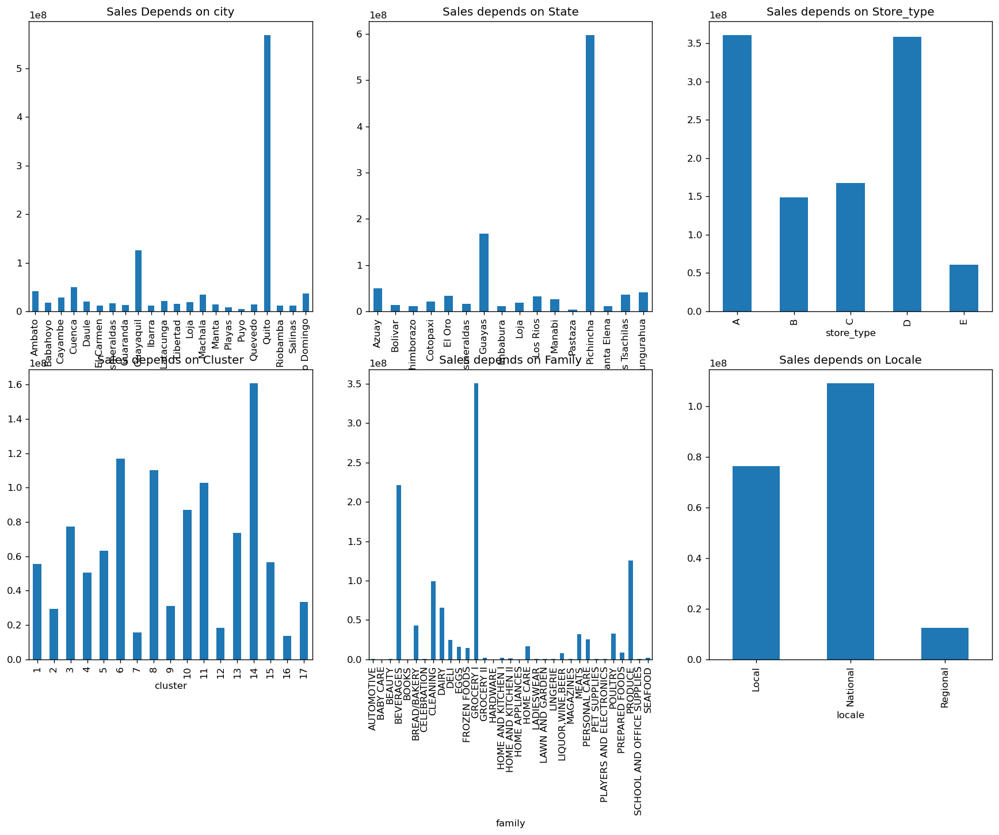

In [48]:
plt.figure(figsize=(18, 12), dpi= 120)

plt.subplot(2,3,1)
sales_city = train1.groupby(['city'])['sales'].sum()
sales_city.plot.bar()
plt.title('Sales Depends on city')

plt.subplot(2,3,2)
sales_state = train1.groupby(['state'])['sales'].sum()
sales_state.plot.bar()
plt.title('Sales depends on State')

plt.subplot(2,3,3)
sales_state = train1.groupby(['store_type'])['sales'].sum()
sales_state.plot.bar()
plt.title('Sales depends on Store_type')

plt.subplot(2,3,4)
sales_state = train1.groupby(['cluster'])['sales'].sum()
sales_state.plot.bar()
plt.title('Sales depends on Cluster')

plt.subplot(2,3,5)
sales_state = train1.groupby(['family'])['sales'].sum()
sales_state.plot.bar()
plt.title('Sales depends on Family')

plt.subplot(2,3,6)
sales_state = train1.groupby(['locale'])['sales'].sum()
sales_state.plot.bar()
plt.title('Sales depends on Locale')

Exploratory Analysis

In [49]:
import plotly.express as px
agg = train1.groupby('date').agg({'sales' : 'mean'}).reset_index()
fig = px.line(agg, x='date',y='sales')
fig.update_layout(title = 'Average Sales by Date')

agg = train1.groupby('date').agg({'transactions' : 'mean'}).reset_index()
fig = px.line(agg, x='date',y='transactions')
fig.update_layout(title = 'Average Transactions by Date')

<Axes: xlabel='date'>

Text(0.5, 1.0, 'Sale per store')

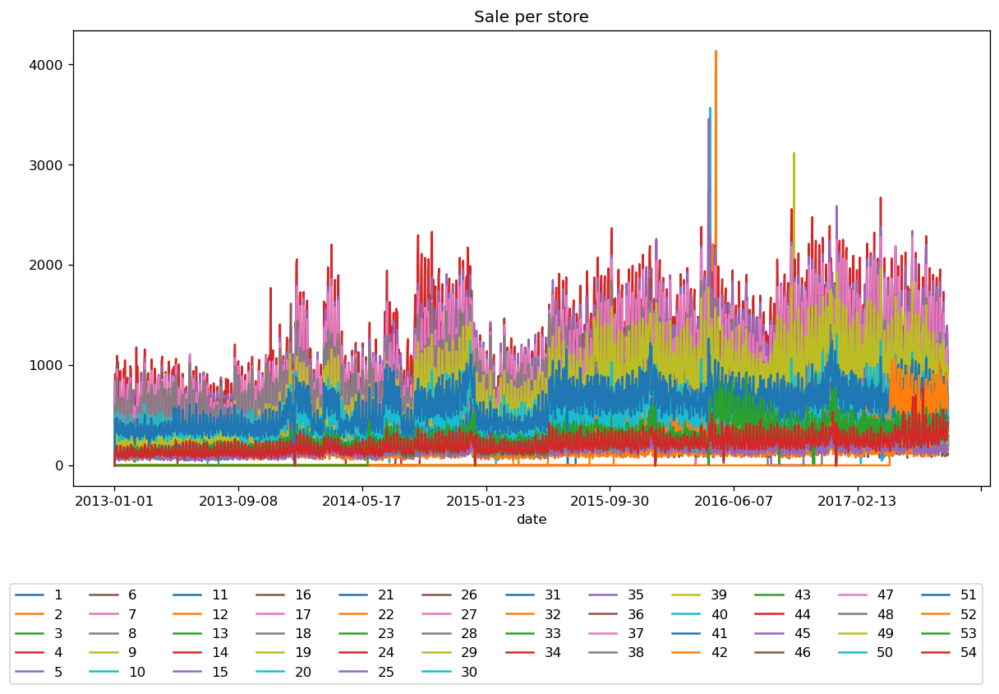

In [50]:
sales_store = train1.groupby(['date', 'store_nbr']).sales.mean().reset_index()
sales_store = sales_store.pivot(index='date', columns='store_nbr', values='sales')
sales_store.plot(figsize=(12,6))
plt.title('Sale per store', fontsize=12)
plt.legend(bbox_to_anchor=(1, -.2), ncol=12)
plt.show()

In [51]:
agg = train1.groupby(['date','store_type']).agg({'sales':'mean'}).reset_index()
fig = px.line(agg, x='date', y='sales',color='store_type')
fig.update_layout(title = 'Average Sales by Date and Store Type')

agg = train1.groupby(['date','store_type']).agg({'transactions':'mean'}).reset_index()
fig = px.line(agg, x='date', y='transactions',color='store_type')
fig.update_layout(title = 'Average Transactions by Date and Store Type')

In [52]:
agg = train1.groupby(['date','cluster']).agg({'sales':'mean'}).reset_index()
fig = px.line(agg, x ='date', y='sales',color='cluster')
fig.update_layout(title = 'Average Sales by Date and Store Number')


agg = train1.groupby(['date','cluster']).agg({'transactions':'mean'}).reset_index()
fig = px.line(agg, x ='date', y='transactions',color='cluster')
fig.update_layout(title = 'Average Transactions by Date and Store Number')

In [53]:
agg = train1.groupby(['date','family']).agg({'sales':'mean'}).reset_index()
fig = px.line(agg, x ='date', y='sales',color='family')
fig.update_layout(title = 'Average Sales by Date and Family')


agg = train1.groupby(['date','locale']).agg({'transactions':'mean'}).reset_index()
fig = px.line(agg, x ='date', y='transactions',color='locale')
fig.update_layout(title = 'Average Transactions by Date and Locale')

Let's now look at various other columns and their related average sales

In [54]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
def vbar(col):
    temp = train1.groupby(col).agg({"sales" : "mean"}).reset_index()
    temp = temp.sort_values('sales', ascending = False)
    c = {
        'x' : list(temp['sales'])[:15][::-1], 
        'y' : list(temp[col])[:15][::-1],
        'title' : "Average sales by "+col
    }
    trace = go.Bar(y=[str(_) + "    " for _ in c['y']], x=c['x'], orientation="h", marker=dict(color="#f77e90"))
    return trace 

    layout = go.Layout(title=c['title'], 
                           paper_bgcolor='rgba(0,0,0,0)', plot_bgcolor='rgba(0,0,0,0)',
                           xaxis_title="", yaxis_title="", width=650)
    fig = go.Figure([trace], layout=layout)
    fig.update_xaxes(tickangle=45, tickfont=dict(color='crimson'))
    fig.update_yaxes(tickangle=0, tickfont=dict(color='crimson'))
    fig.show()
    
trace1 = vbar('family') 
trace2 = vbar('store_type') 
trace3 = vbar('state') 
trace4 = vbar('city') 

titles = ['Store Family', 'Store Type', 'State', 'City']
titles = ['Top ' + _ + " by Average Sales" for _ in titles]
fig = make_subplots(rows=2, cols=2, subplot_titles = titles)

fig.add_trace(trace1, row=1, col=1).add_trace(trace2, row=1, col=2).add_trace(trace3, row=2, col=1).add_trace(trace4, row=2, col=2).update_layout(height=800, paper_bgcolor='white', plot_bgcolor='white', showlegend = False)

#fig.update_layout(height=800, paper_bgcolor='white', plot_bgcolor='white', showlegend = False)

In [55]:
trace1 = vbar('cluster')
trace2 = vbar('store_nbr')

titles = ['Cluster Number','Store Number']
titles = ['Top ' + _ + " by Average Sales" for _ in titles]
fig = make_subplots(rows=1, cols=2, subplot_titles=titles)

fig.add_trace(trace1, row=1, col=1).add_trace(trace2, row=1, col=2).update_layout(height=800, paper_bgcolor='white', plot_bgcolor='white', showlegend = False)

# Feature Engineering

In [56]:
def create_ts_feature(df):
    df['date'] = pd.to_datetime(df['date'])
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    return df

train1 = create_ts_feature(train1)
test1 = create_ts_feature(test1)
train1.head()

,id,date,store_nbr,family,sales,onpromotion,dcoilwtico,holiday_type,locale,locale_name,description,transferred,city,state,store_type,cluster,transactions,dayofweek,quarter,month,year,dayofyear,dayofmonth
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,Quito,Pichincha,D,13,NaN,1,1,1,2013,1,1
1,1,2013-01-01,1,BABY CARE,0.00,0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,Quito,Pichincha,D,13,NaN,1,1,1,2013,1,1
2,2,2013-01-01,1,BEAUTY,0.00,0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,Quito,Pichincha,D,13,NaN,1,1,1,2013,1,1
3,3,2013-01-01,1,BEVERAGES,0.00,0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,Quito,Pichincha,D,13,NaN,1,1,1,2013,1,1
4,4,2013-01-01,1,BOOKS,0.00,0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,Quito,Pichincha,D,13,NaN,1,1,1,2013,1,1


In [57]:
def hbar(col) :
    temp = train1.groupby(col).agg({'sales':'mean'}).reset_index()
    temp = temp.sort_values(col, ascending = False)
    c = {
        'y' : list(temp['sales']),
        'x' : list(temp[col]),
        'title' : 'Average sales by ' +  col
    }

    trace = go.Bar(y=c['y'], x=c['x'], orientation='v', marker=dict(color='#bbe707'))
    return trace

    layout = go.Layout(title=c['title'],
                       paper_bgcolor='white',
                       plot_bgcolor= 'white',
                       xaxis_title = '',
                       yaxis_title = '',
                       width=650)
    
    fig = go.Figure([trace], layout=layout).update_xaxes(tickangle=45, tickfont=dict(color='orimson')).update_yaxes(tickangle=45, tickfont=dict(color='crimson'))
    fig.show()

trace1 = hbar('dayofweek')
trace2 = hbar('dayofmonth')
trace3 = hbar('dayofyear')
trace4 = hbar('month')
trace5 = hbar('quarter')
trace6 = hbar('year')

titles = ['Day of Week', 'Day of Month','Day of Year', 'Month', 'Quarter', 'Year']
titles = ['Average Sales by ' + _ for _ in titles]
fig = make_subplots(rows=3, cols=2, subplot_titles=titles)

fig.add_trace(trace1, row=1, col=1).add_trace(trace2, row=1, col=2).add_trace(trace3, row=2, col=1).add_trace(trace4, row=2, col=2).add_trace(trace5, row=3, col=1).add_trace(trace6, row=3, col=2).update_layout(height=1200, paper_bgcolor='white', plot_bgcolor='white', showlegend = False)


In [58]:
agg = train1.groupby(['year', 'month']).agg({'sales':'mean', 'transactions':'mean'}).reset_index()
fig = px.box(agg, y ='sales', facet_col = 'month', color = 'month', boxmode='overlay', points = 'all').update_layout(title='Average Sales Distribute by Store Type')
fig.show()

In [59]:
agg = train1.groupby(['year', 'store_type']).agg({'sales':'mean', 'transactions':'mean'}).reset_index()
fig = px.box(agg, y ='sales', facet_col = 'store_type', color = 'store_type', boxmode='overlay', points = 'all').update_layout(title='Average Sales Distribute by Store Type')
fig.show()

In [60]:
train1['holiday_type'] = train1['holiday_type'].fillna('No Holiday/Event')
train1['holiday_type'].value_counts()

def convert_t0_size(x):
    if x < 50:
        return 6
    elif x < 100:
        return 10
    elif x < 150:
        return 15
    elif x < 250:
        return 18
    elif x < 300:
        return 24
    elif x < 500:
        return 30
    else:
        return 40
    
def bubble(col1, col2):
    vc = train1.groupby([col1, col2]).agg({'sales':'mean'}).reset_index()
    vc = vc.sort_values(col2)
    fig = px.scatter(vc, x=col1, y=col2, size='sales', color='sales', size_max=40).update_layout(title = 'Average Sales by ' +col1+" and " + col2).show()
    
bubble('month','holiday_type')
bubble('month','store_type')

No Holiday/Event    2551824
Holiday              304722
Event                 99792
Additional            67716
Transfer              16038
Work Day               8910
Bridge                 5346
Name: holiday_type, dtype: int64

In [61]:
train1

,id,date,store_nbr,family,sales,onpromotion,dcoilwtico,holiday_type,locale,locale_name,description,transferred,city,state,store_type,cluster,transactions,dayofweek,quarter,month,year,dayofyear,dayofmonth
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,Quito,Pichincha,D,13,NaN,1,1,1,2013,1,1
1,1,2013-01-01,1,BABY CARE,0.00,0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,Quito,Pichincha,D,13,NaN,1,1,1,2013,1,1
2,2,2013-01-01,1,BEAUTY,0.00,0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,Quito,Pichincha,D,13,NaN,1,1,1,2013,1,1
3,3,2013-01-01,1,BEVERAGES,0.00,0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,Quito,Pichincha,D,13,NaN,1,1,1,2013,1,1
4,4,2013-01-01,1,BOOKS,0.00,0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,Quito,Pichincha,D,13,NaN,1,1,1,2013,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3054343,3000883,2017-08-15,9,POULTRY,438.13,0,47.57,Holiday,Local,Riobamba,Fundacion de Riobamba,False,Quito,Pichincha,B,6,2155.00,1,3,8,2017,227,15
3054344,3000884,2017-08-15,9,PREPARED FOODS,154.55,1,47.57,Holiday,Local,Riobamba,Fundacion de Riobamba,False,Quito,Pichincha,B,6,2155.00,1,3,8,2017,227,15
3054345,3000885,2017-08-15,9,PRODUCE,2419.73,148,47.57,Holiday,Local,Riobamba,Fundacion de Riobamba,False,Quito,Pichincha,B,6,2155.00,1,3,8,2017,227,15
3054346,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.00,8,47.57,Holiday,Local,Riobamba,Fundacion de Riobamba,False,Quito,Pichincha,B,6,2155.00,1,3,8,2017,227,15


<Axes: xlabel='year'>

([<matplotlib.axis.XTick at 0x1b18d1bb650>,
 [Text(2013, 0, '2013'),
  Text(2014, 0, '2014'),
  Text(2015, 0, '2015'),
  Text(2016, 0, '2016'),
  Text(2017, 0, '2017')])

<Axes: xlabel='year'>

([<matplotlib.axis.XTick at 0x1b18d3d1950>,
 [Text(2013, 0, '2013'),
  Text(2014, 0, '2014'),
  Text(2015, 0, '2015'),
  Text(2016, 0, '2016'),
  Text(2017, 0, '2017')])

<Axes: xlabel='month'>

([<matplotlib.axis.XTick at 0x1b18ebcab50>,
 [Text(1, 0, 'January'),
  Text(2, 0, 'February'),
  Text(3, 0, 'March'),
  Text(4, 0, 'April'),
  Text(5, 0, 'May'),
  Text(6, 0, 'June'),
  Text(7, 0, 'July'),
  Text(8, 0, 'August'),
  Text(9, 0, 'September'),
  Text(10, 0, 'October'),
  Text(11, 0, 'November'),
  Text(12, 0, 'December')])

<Axes: xlabel='month'>

([<matplotlib.axis.XTick at 0x1b18ec80c50>,
 [Text(1, 0, 'January'),
  Text(2, 0, 'February'),
  Text(3, 0, 'March'),
  Text(4, 0, 'April'),
  Text(5, 0, 'May'),
  Text(6, 0, 'June'),
  Text(7, 0, 'July'),
  Text(8, 0, 'August'),
  Text(9, 0, 'September'),
  Text(10, 0, 'October'),
  Text(11, 0, 'November'),
  Text(12, 0, 'December')])

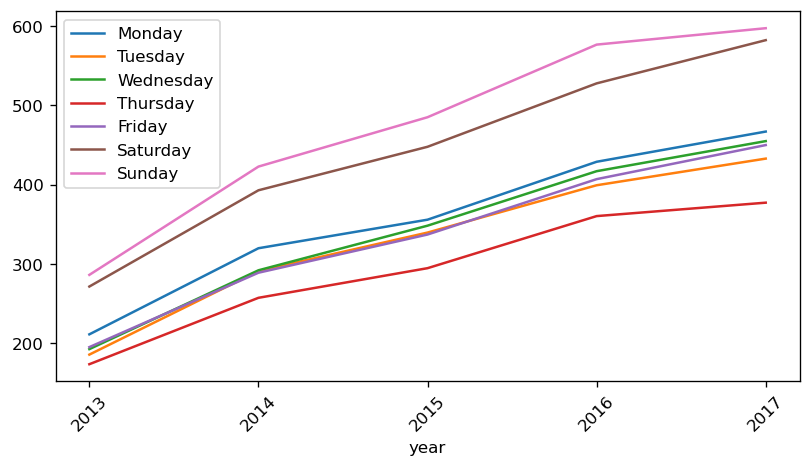

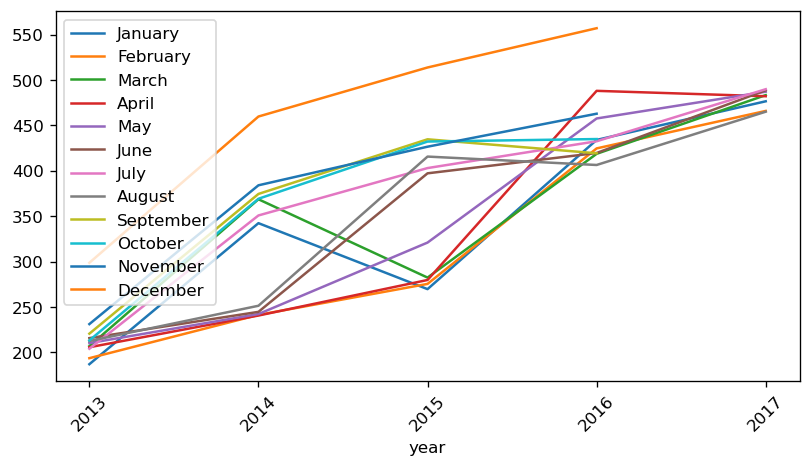

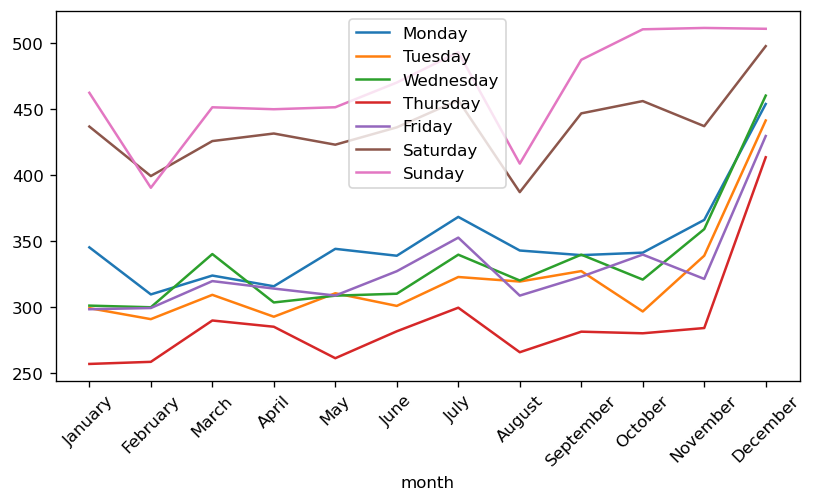

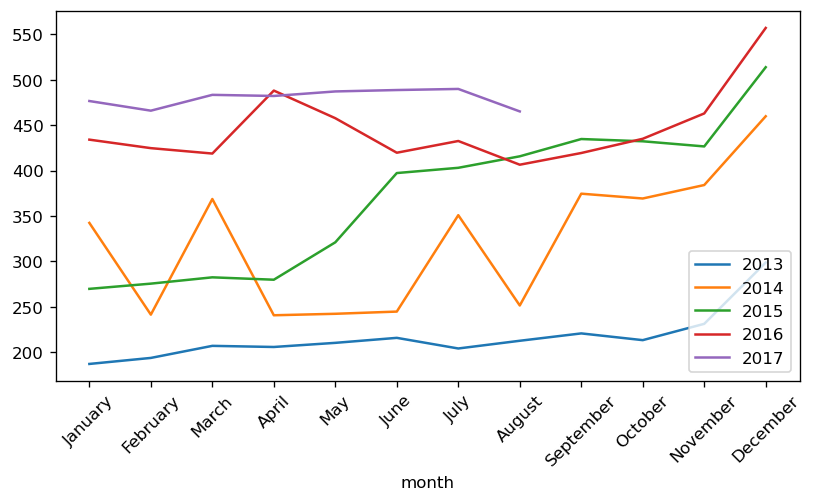

In [62]:
list_days = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
list_months = ['January','February','March','April','May','June','July','August','September','October','November','December'] 
list_years = ['2013','2014','2015','2016','2017']

frame1 = train1.groupby(['dayofweek','year'], as_index=False)['sales'].mean()
frame1 = frame1.pivot(index='year', columns='dayofweek',values='sales')
frame1.plot(figsize=(8,4))
plt.xticks(range(2013,2018,1), rotation=45)
plt.legend(list_days)

frame1 = train1.groupby(['month','year'], as_index=False)['sales'].mean()
frame1 = frame1.pivot(index='year', columns='month',values='sales')
frame1.plot(figsize=(8,4))
plt.xticks(range(2013,2018,1), rotation=45)
plt.legend(list_months)

frame1 = train1.groupby(['dayofweek','month'], as_index=False)['sales'].mean()
frame1 = frame1.pivot(index='month', columns='dayofweek',values='sales')
frame1.plot(figsize=(8,4))
plt.xticks(range(1,13), rotation=45, labels=list_months)
plt.legend(list_days)

frame1 = train1.groupby(['month','year'], as_index=False)['sales'].mean()
frame1 = frame1.pivot(index='month', columns='year',values='sales')
frame1.plot(figsize=(8,4))
plt.xticks(range(1,13), rotation=45, labels=list_months)
plt.legend(list_years)

<Axes: xlabel='year'>

([<matplotlib.axis.XTick at 0x1b18d3a4550>,
 [Text(2013, 0, '2013'),
  Text(2014, 0, '2014'),
  Text(2015, 0, '2015'),
  Text(2016, 0, '2016'),
  Text(2017, 0, '2017')])

<Axes: xlabel='year'>

([<matplotlib.axis.XTick at 0x1b18ee02910>,
 [Text(2013, 0, '2013'),
  Text(2014, 0, '2014'),
  Text(2015, 0, '2015'),
  Text(2016, 0, '2016'),
  Text(2017, 0, '2017')])

<Axes: xlabel='month'>

([<matplotlib.axis.XTick at 0x1b18d1f3c50>,
 [Text(1, 0, 'January'),
  Text(2, 0, 'February'),
  Text(3, 0, 'March'),
  Text(4, 0, 'April'),
  Text(5, 0, 'May'),
  Text(6, 0, 'June'),
  Text(7, 0, 'July'),
  Text(8, 0, 'August'),
  Text(9, 0, 'September'),
  Text(10, 0, 'October'),
  Text(11, 0, 'November'),
  Text(12, 0, 'December')])

<Axes: xlabel='month'>

([<matplotlib.axis.XTick at 0x1b18d208f50>,
 [Text(1, 0, 'January'),
  Text(2, 0, 'February'),
  Text(3, 0, 'March'),
  Text(4, 0, 'April'),
  Text(5, 0, 'May'),
  Text(6, 0, 'June'),
  Text(7, 0, 'July'),
  Text(8, 0, 'August'),
  Text(9, 0, 'September'),
  Text(10, 0, 'October'),
  Text(11, 0, 'November'),
  Text(12, 0, 'December')])

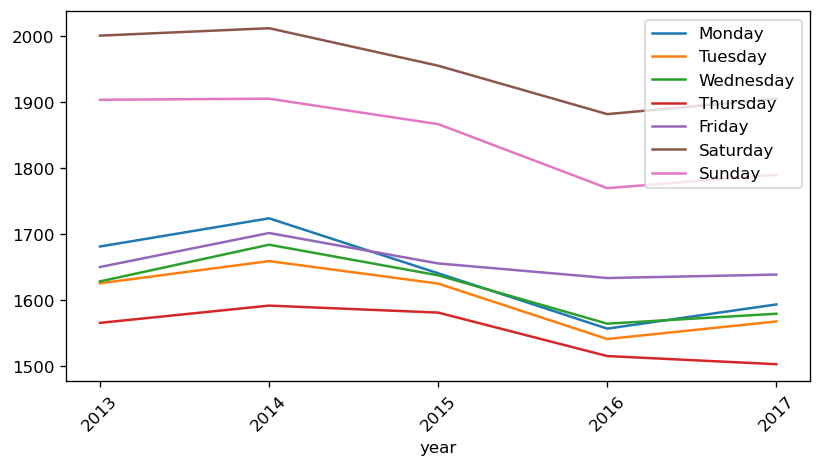

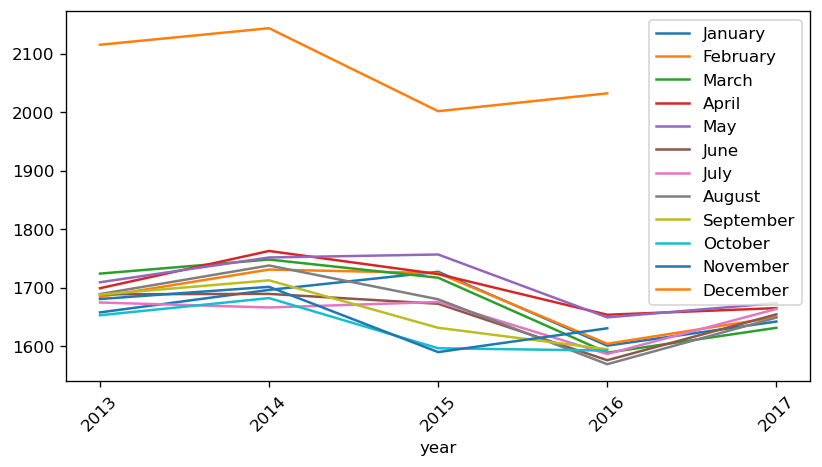

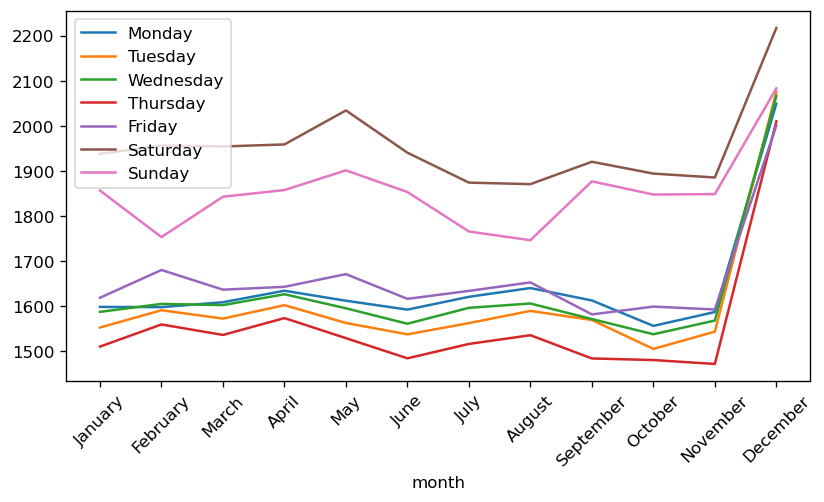

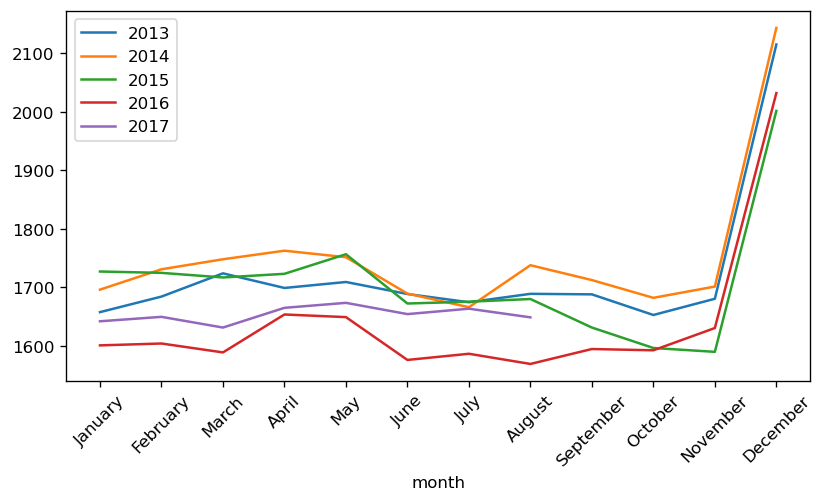

In [63]:
frame1 = train1.groupby(['dayofweek','year'], as_index=False)['transactions'].mean()
frame1 = frame1.pivot(index='year', columns='dayofweek',values='transactions')
frame1.plot(figsize=(8,4))
plt.xticks(range(2013,2018,1), rotation=45)
plt.legend(list_days)

frame1 = train1.groupby(['month','year'], as_index=False)['transactions'].mean()
frame1 = frame1.pivot(index='year', columns='month',values='transactions')
frame1.plot(figsize=(8,4))
plt.xticks(range(2013,2018,1), rotation=45)
plt.legend(list_months)

frame1 = train1.groupby(['dayofweek','month'], as_index=False)['transactions'].mean()
frame1 = frame1.pivot(index='month', columns='dayofweek',values='transactions')
frame1.plot(figsize=(8,4))
plt.xticks(range(1,13), rotation=45, labels=list_months)
plt.legend(list_days)

frame1 = train1.groupby(['month','year'], as_index=False)['transactions'].mean()
frame1 = frame1.pivot(index='month', columns='year',values='transactions')
frame1.plot(figsize=(8,4))
plt.xticks(range(1,13), rotation=45, labels=list_months)
plt.legend(list_years)

What products are affected by discounts?

<Figure size 1920x960 with 0 Axes>

<Axes: >

<Axes: xlabel='onpromotion', ylabel='Count'>

Text(0.5, 1.0, 'Sale Depends on Promotion')

<Axes: >

<Axes: xlabel='family'>

Text(0.5, 1.0, 'On Promotion')

<Axes: >

<Axes: xlabel='family'>

Text(0.5, 1.0, 'On Promotion')

<Axes: >

<Axes: xlabel='onpromotion', ylabel='Count'>

Text(0.5, 1.0, 'Sale Depends on Promotion')

<Axes: >

<Axes: xlabel='family'>

Text(0.5, 1.0, 'On Promotion')

<Axes: >

<Axes: xlabel='family'>

Text(0.5, 1.0, 'On Promotion')

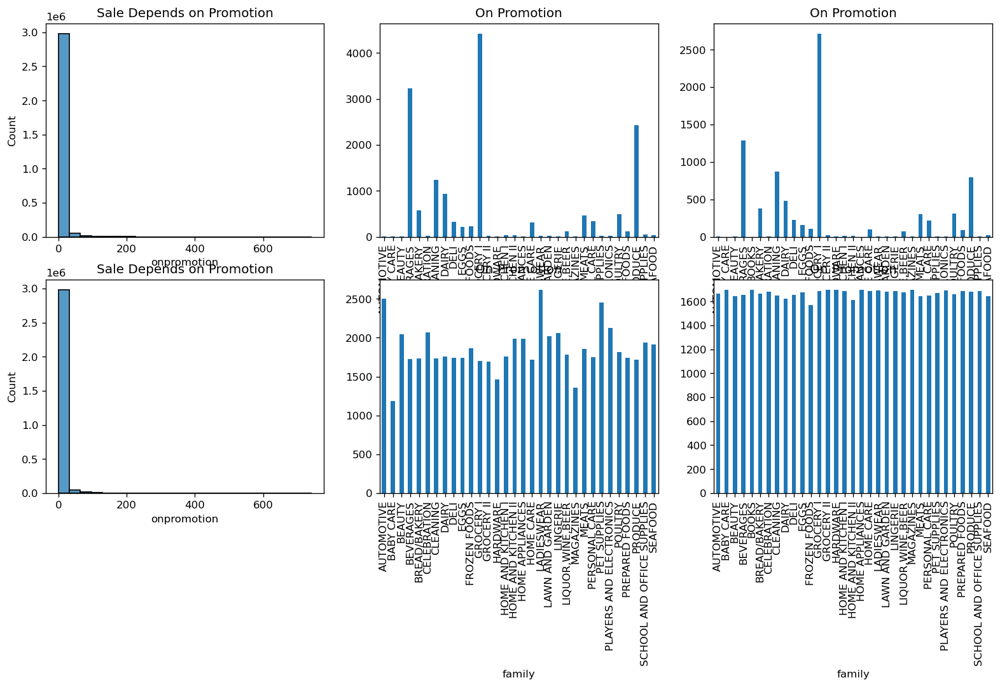

In [64]:
import seaborn as sns

plt.figure(figsize=(16,8))

plt.subplot(2,3,1)
sns.histplot(data=train1, x='onpromotion')
plt.title('Sale Depends on Promotion')

plt.subplot(2,3,2)
data_promo_yes = train1.copy()
data_promo_yes = data_promo_yes[data_promo_yes['onpromotion']!=0]
data_promo_yes = data_promo_yes.groupby(['family'])['sales'].mean()
data_promo_yes.plot.bar()
plt.title('On Promotion')

plt.subplot(2,3,3)
data_promo_no = train1.copy()
data_promo_no = data_promo_no[data_promo_no['onpromotion']==0]
data_promo_no = data_promo_no.groupby(['family'])['sales'].mean()
data_promo_no.plot.bar()
plt.title('On Promotion')

plt.subplot(2,3,4)
sns.histplot(data=train1, x='onpromotion')
plt.title('Sale Depends on Promotion')

plt.subplot(2,3,5)
data_promo_yes = train1.copy()
data_promo_yes = data_promo_yes[data_promo_yes['onpromotion']!=0]
data_promo_yes = data_promo_yes.groupby(['family'])['transactions'].mean()
data_promo_yes.plot.bar()
plt.title('On Promotion')

plt.subplot(2,3,6)
data_promo_no = train1.copy()
data_promo_no = data_promo_no[data_promo_no['onpromotion']==0]
data_promo_no = data_promo_no.groupby(['family'])['transactions'].mean()
data_promo_no.plot.bar()
plt.title('On Promotion')

Correlation of oil prices and sales/promotions/transactions

<Figure size 1920x960 with 0 Axes>

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0, 0.5, 'Average Sales')

Text(0.5, 1.0, 'Average Sales vs. Oil Prices')

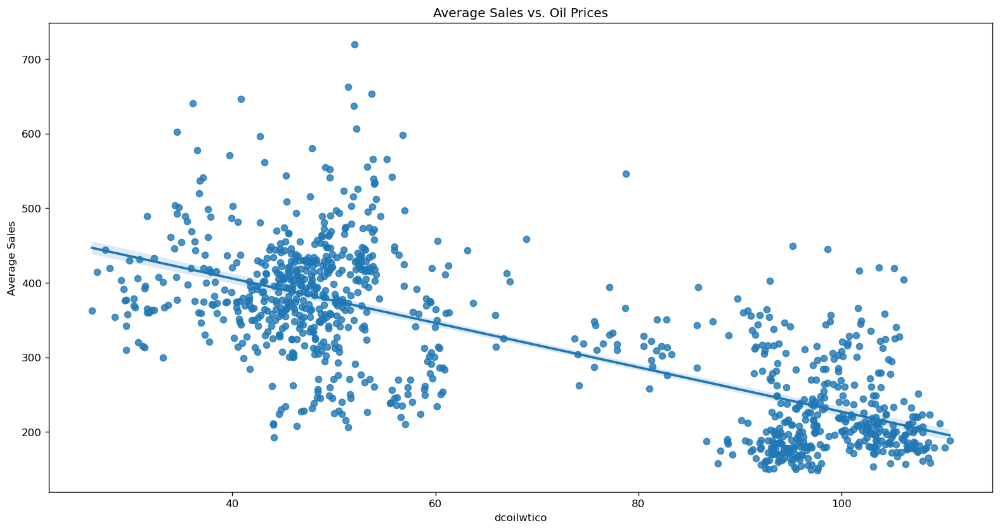

<Figure size 1920x960 with 0 Axes>

<Axes: xlabel='dcoilwtico', ylabel='transactions'>

Text(0, 0.5, 'Average Transactions')

Text(0.5, 1.0, 'Average Transactions vs. Oil Prices')

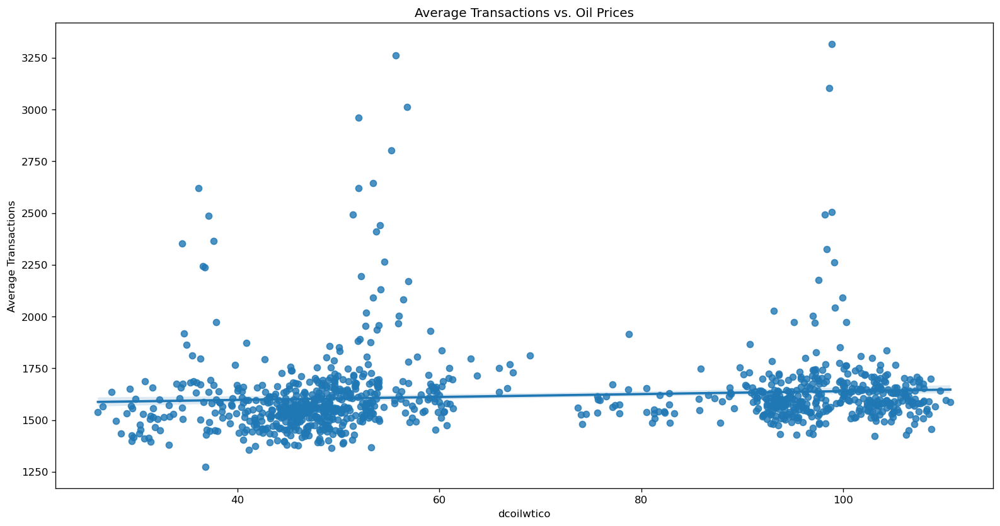

In [65]:
data_sales_oil = train1.copy()
data_sales_oil = data_sales_oil.groupby(['dcoilwtico'], as_index=False)['sales'].mean()

plt.figure(figsize=(16,8))
sns.regplot(x=data_sales_oil.dcoilwtico, y=data_sales_oil.sales)
plt.ylabel('Average Sales')
plt.title('Average Sales vs. Oil Prices')
plt.show()

data_sales_oil = train1.copy()
data_sales_oil = data_sales_oil.groupby(['dcoilwtico'], as_index=False)['transactions'].mean()

plt.figure(figsize=(16,8))
sns.regplot(x=data_sales_oil.dcoilwtico, y=data_sales_oil.transactions)
plt.ylabel('Average Transactions')
plt.title('Average Transactions vs. Oil Prices')
plt.show()

<Axes: xlabel='transactions', ylabel='sales'>

Text(0.5, 0, 'Transactions')

Text(0, 0.5, 'Average Sales')

Text(0.5, 1.0, 'Average Sales vs. Store Transactions')

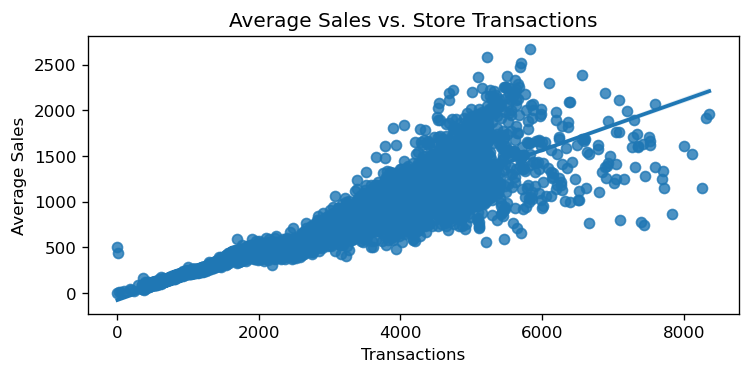

In [66]:
data_sales_transactions = train1.copy()
data_sales_transactions = data_sales_transactions.groupby(['transactions'], as_index=False)['sales'].mean()

sns.regplot(x=data_sales_transactions.transactions, y=data_sales_transactions.sales)
plt.xlabel('Transactions')
plt.ylabel('Average Sales')
plt.title('Average Sales vs. Store Transactions')

In [67]:
train
oil

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0
1,1,2013-01-01,1,BABY CARE,0.00,0
2,2,2013-01-01,1,BEAUTY,0.00,0
3,3,2013-01-01,1,BEVERAGES,0.00,0
4,4,2013-01-01,1,BOOKS,0.00,0
...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.13,0
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.55,1
3000885,3000885,2017-08-15,9,PRODUCE,2419.73,148
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.00,8


,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20
...,...,...
1213,2017-08-25,47.65
1214,2017-08-28,46.40
1215,2017-08-29,46.46
1216,2017-08-30,45.96


<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'HOME AND KITCHEN II\n Corr:-0.79')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'MAGAZINES\n Corr:-0.71')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'BEVERAGES\n Corr:-0.65')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'BREAD/BAKERY\n Corr:-0.65')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'PET SUPPLIES\n Corr:-0.63')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'BEAUTY\n Corr:-0.63')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'HOME AND KITCHEN I\n Corr:-0.63')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'SCHOOL AND OFFICE SUPPLIES\n Corr:-0.63')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'CELEBRATION\n Corr:-0.62')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'DAIRY\n Corr:-0.62')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'DELI\n Corr:-0.62')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'AUTOMOTIVE\n Corr:-0.61')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'BABY CARE\n Corr:-0.61')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'GROCERY I\n Corr:-0.60')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'PLAYERS AND ELECTRONICS\n Corr:-0.59')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'PREPARED FOODS\n Corr:-0.59')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'HOME CARE\n Corr:-0.58')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'PERSONAL CARE\n Corr:-0.58')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'PRODUCE\n Corr:-0.56')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'CLEANING\n Corr:-0.52')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'LADIESWEAR\n Corr:-0.47')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'LAWN AND GARDEN\n Corr:-0.46')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'FROZEN FOODS\n Corr:-0.46')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'EGGS\n Corr:-0.44')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'HARDWARE\n Corr:-0.40')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'POULTRY\n Corr:-0.37')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'GROCERY II\n Corr:-0.27')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'SEAFOOD\n Corr:-0.25')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'LIQUOR,WINE,BEER\n Corr:-0.24')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'BOOKS\n Corr:-0.20')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'MEATS\n Corr:-0.15')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'HOME APPLIANCES\n Corr:0.069')

<Axes: xlabel='dcoilwtico', ylabel='sales'>

Text(0.5, 1.0, 'LINGERIE\n Corr:0.477')

Text(0.5, 0.98, 'Average Sales for Family vs. Oil Prices \n')

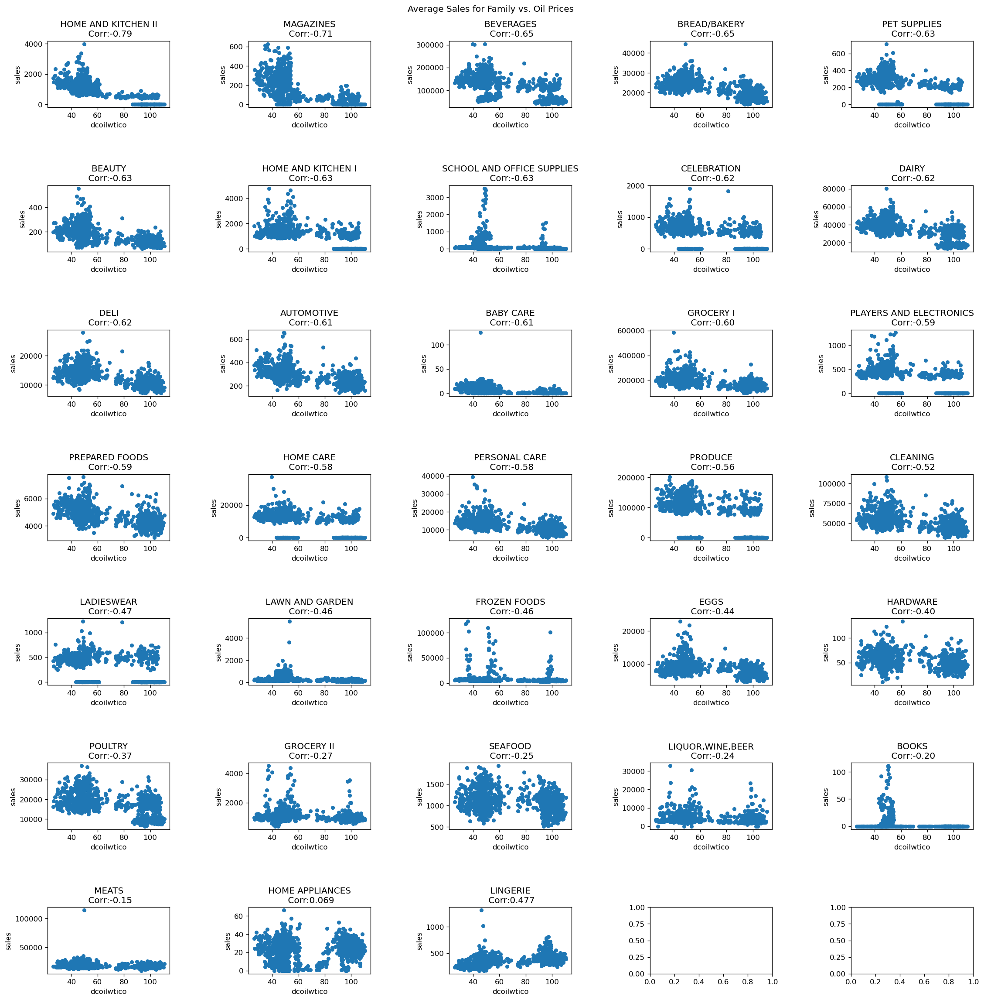

In [68]:
df_train_oil = pd.merge(train.groupby(['date','family'])['sales'].sum().reset_index(),
                        oil, how='left')
corr_train_oil = df_train_oil.groupby('family').corr('spearman').reset_index()
corr_train_oil = corr_train_oil[corr_train_oil[
    'level_1'] == 'dcoilwtico'][['family','sales']].sort_values('sales')

fig, axes = plt.subplots(7, 5, figsize=(20,20))
for i, j in enumerate(corr_train_oil['family']):
    df_train_oil[df_train_oil['family'] == j].plot.scatter(x="dcoilwtico", y="sales", ax=axes[i // 5, i % 5])
    axes[i // 5, i % 5].set_title(j + "\n Corr:" + str(
        corr_train_oil[corr_train_oil.family == j].sales.iloc[0])[:5])

    
plt.tight_layout(pad=5)
plt.suptitle('Average Sales for Family vs. Oil Prices \n')
plt.show()

In [69]:
def map_month_to_season(month):
    if month in [12, 1, 2]:
        return 0
    elif month in [3, 4, 5]:
        return 1
    elif month in [6, 7, 8]:
        return 2
    elif month in [9, 10, 11]:
        return 3
    else:
        return 'NaN'
    
train1['season'] = train1['month'].apply(map_month_to_season)
train1.head()

,id,date,store_nbr,family,sales,onpromotion,dcoilwtico,holiday_type,locale,locale_name,description,transferred,city,state,store_type,cluster,transactions,dayofweek,quarter,month,year,dayofyear,dayofmonth,season
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,Quito,Pichincha,D,13,NaN,1,1,1,2013,1,1,0
1,1,2013-01-01,1,BABY CARE,0.00,0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,Quito,Pichincha,D,13,NaN,1,1,1,2013,1,1,0
2,2,2013-01-01,1,BEAUTY,0.00,0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,Quito,Pichincha,D,13,NaN,1,1,1,2013,1,1,0
3,3,2013-01-01,1,BEVERAGES,0.00,0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,Quito,Pichincha,D,13,NaN,1,1,1,2013,1,1,0
4,4,2013-01-01,1,BOOKS,0.00,0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,Quito,Pichincha,D,13,NaN,1,1,1,2013,1,1,0


<Figure size 2400x2400 with 0 Axes>

<Axes: >

<Axes: xlabel='family'>

Text(0.5, 1.0, 'Sales Winter')

<Axes: >

<Axes: xlabel='family'>

Text(0.5, 1.0, 'Sales Spring')

<Axes: >

<Axes: xlabel='family'>

Text(0.5, 1.0, 'Sales Summer')

<Axes: >

<Axes: xlabel='family'>

Text(0.5, 1.0, 'Sales Fall')

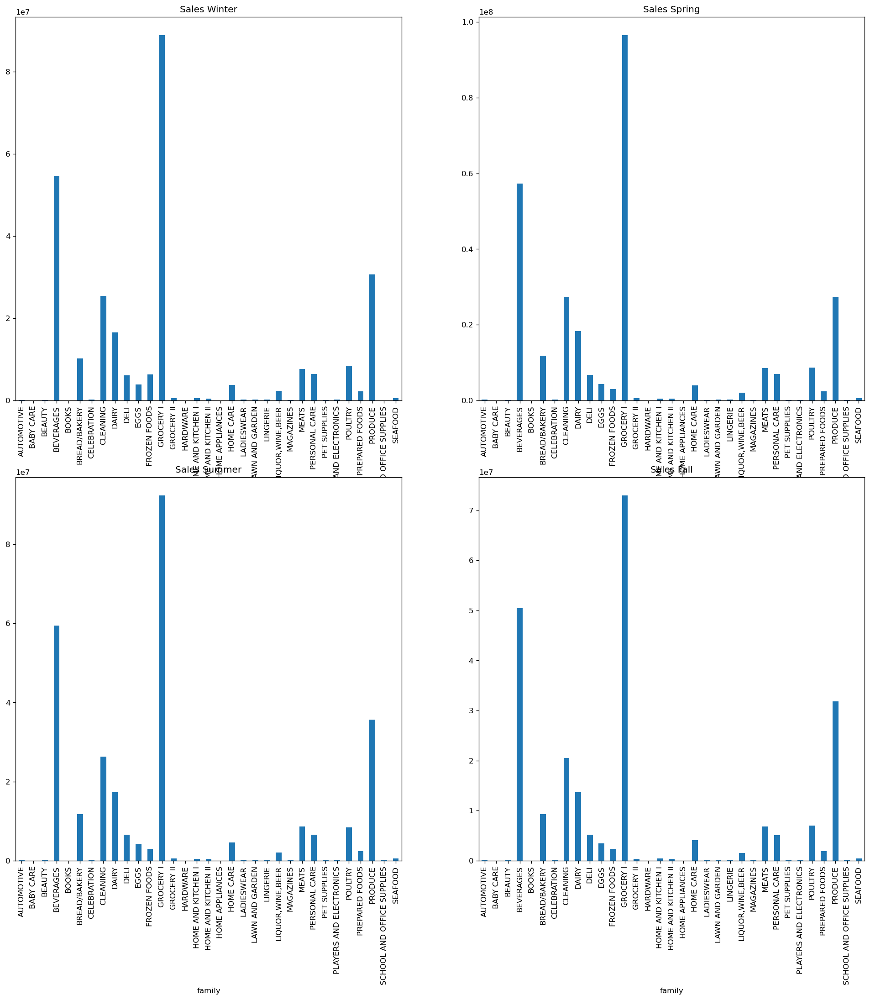

In [72]:
data_season = train1.copy()
plt.figure(figsize=(20,20))

plt.subplot(2,2,1)
data_winter = data_season[data_season['season']==0]
sales_fammily_winter = data_winter.groupby(['family'])['sales'].sum()
sales_fammily_winter.plot.bar()
plt.title('Sales Winter')

plt.subplot(2,2,2)
data_spring = data_season[data_season['season']==1]
sales_fammily_spring = data_spring.groupby(['family'])['sales'].sum()
sales_fammily_spring.plot.bar()
plt.title('Sales Spring')

plt.subplot(2,2,3)
data_summer = data_season[data_season['season']==2]
sales_family_summer = data_summer.groupby(['family'])['sales'].sum()
sales_family_summer.plot.bar()
plt.title('Sales Summer')

plt.subplot(2,2,4)
data_fall = data_season[data_season['season']==3]
sales_fammily_fall = data_fall.groupby(['family'])['sales'].sum()
sales_fammily_fall.plot.bar()
plt.title('Sales Fall')

In [73]:
data_seasons = train1.copy()
data_winter = data_seasons[data_seasons['season']==0]
data_spring = data_seasons[data_seasons['season']==1]
data_summer = data_seasons[data_seasons['season']==2]
data_fall = data_seasons[data_seasons['season']==3]

sales_family_winter = data_winter.groupby(['family'])['sales'].sum().reset_index()
sales_family_spring = data_spring.groupby(['family'])['sales'].sum().reset_index()
sales_family_summer = data_summer.groupby(['family'])['sales'].sum().reset_index()
sales_family_fall = data_fall.groupby(['family'])['sales'].sum().reset_index()

sales_family_winter = sales_family_winter.rename(columns = {"sales": "sales_winter"})
sales_family_spring = sales_family_spring.rename(columns = {"sales": "sales_spring"})
sales_family_summer = sales_family_summer.rename(columns = {"sales": "sales_summer"})
sales_family_fall = sales_family_fall.rename(columns = {"sales": "sales_fall"})

df_all_seasons = sales_family_winter.merge(
    sales_family_spring, on=["family"]).merge(
    sales_family_summer, on=["family"]).merge(
    sales_family_fall, on=["family"])

df_all_seasons.head()

,family,sales_winter,sales_spring,sales_summer,sales_fall
0,AUTOMOTIVE,141932.00,156875.00,152008.00,115583.00
1,BABY CARE,2535.00,2459.00,3264.00,2072.00
2,BEAUTY,85912.00,86473.00,96919.00,76325.00
3,BEVERAGES,54568066.00,57234779.00,59438578.00,50422117.00
4,BOOKS,2398.00,895.00,119.00,3128.00


<Axes: xlabel='family'>

Text(0.5, 1.0, 'AUTOMOTIVE')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'BABY CARE')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'BEAUTY')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'BEVERAGES')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'BOOKS')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'BREAD/BAKERY')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'CELEBRATION')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'CLEANING')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'DAIRY')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'DELI')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'EGGS')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'FROZEN FOODS')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'GROCERY I')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'GROCERY II')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'HARDWARE')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'HOME AND KITCHEN I')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'HOME AND KITCHEN II')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'HOME APPLIANCES')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'HOME CARE')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'LADIESWEAR')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'LAWN AND GARDEN')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'LINGERIE')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'LIQUOR,WINE,BEER')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'MAGAZINES')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'MEATS')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'PERSONAL CARE')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'PET SUPPLIES')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'PLAYERS AND ELECTRONICS')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'POULTRY')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'PREPARED FOODS')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'PRODUCE')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'SCHOOL AND OFFICE SUPPLIES')

<Axes: xlabel='family'>

Text(0.5, 1.0, 'SEAFOOD')

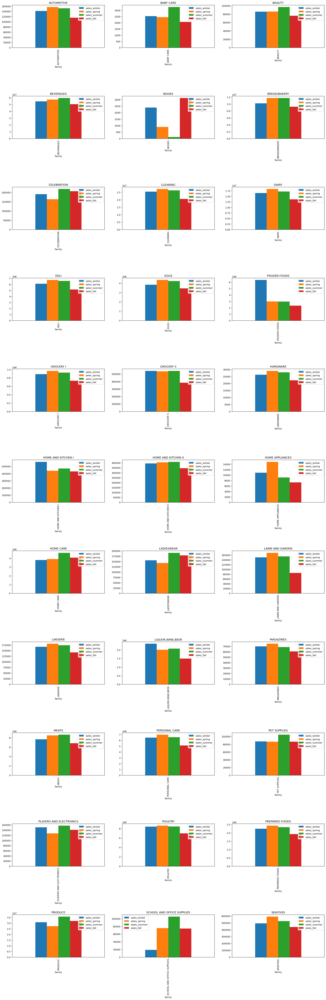

In [ ]:
fig, ax = plt.subplots(11,3, figsize=(20,60))
for i, j in enumerate(df_all_seasons['family']):
    df_all_seasons[df_all_seasons['family'] == j].plot(
        x = 'family', kind='bar', stacked=False, ax=ax[i//3,i%3])
    ax[i//3,i%3].set_title(j)

plt.tight_layout(pad=3)
plt.show()

We can observe how salws of different categories of goods change depending on the season, on the basis of which we can conclude that this an important feature

PROMOTIONS

<Axes: xlabel='onpromotion', ylabel='sales'>

Text(0.5, 0, 'onpromotion')

Text(0, 0.5, 'Average Sales')

Text(0.5, 1.0, 'Average Sale vs. Promotions')

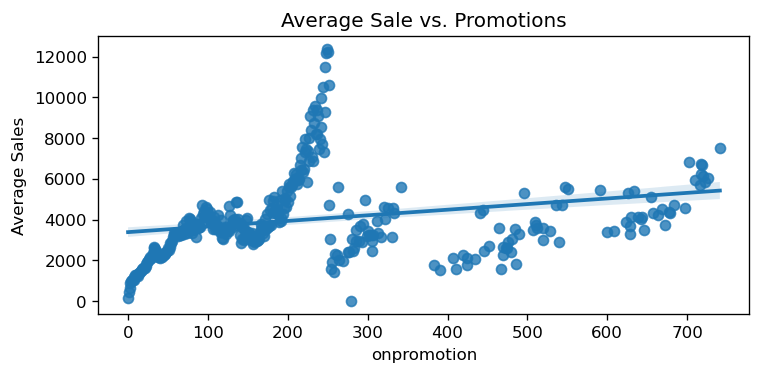

In [ ]:
data_sales_prom = train1.copy()
data_sales_prom = data_sales_prom.groupby(['onpromotion'], as_index=False)['sales'].mean()

sns.regplot(x=data_sales_prom.onpromotion, y=data_sales_prom.sales)
plt.xlabel('onpromotion')
plt.ylabel('Average Sales')
plt.title('Average Sale vs. Promotions')

In [ ]:
def process_holiday(s):
    if "futbol" in s:
        return "futbol"
    to_remove = list(set(stores['city'].str.lower()) | set(stores['state'].str.lower()))
    for w in to_remove:
        s = s.replace(w, "")
    return s

holidays['description'] = holidays.apply(
    lambda x: x['description'].lower().replace(x['locale_name'].lower(), ""), 
    axis=1,).apply(process_holiday).replace(
    r"[+-]\d+|\b(de|del|traslado|recupero|puente|-)\b", "", regex=True,).replace(
    r"\s+|-", " ", regex=True,).str.strip()

# remove transferred holidays
holidays_data = holidays[holidays['transferred'].eq(False)]

#Saturdays designated as work days 
work_days = holidays_data[holidays_data['type'].eq("Work Day")]
work_days = work_days[["date", "type"]].rename(columns={"type": "work_day"}
                                              ).reset_index(drop=True)
work_days['work_day'] = work_days['work_day'].notna().astype(int)

# remove work days after extracting above
holidays_data = holidays_data[holidays_data['type']!="Work Day"].reset_index(drop=True)
holidays_data

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,fundacion,False
1,2012-04-01,Holiday,Regional,Cotopaxi,provincializacion,False
2,2012-04-12,Holiday,Local,Cuenca,fundacion,False
3,2012-04-14,Holiday,Local,Libertad,cantonizacion,False
4,2012-04-21,Holiday,Local,Riobamba,cantonizacion,False
...,...,...,...,...,...,...
328,2017-12-22,Additional,National,Ecuador,navidad,False
329,2017-12-23,Additional,National,Ecuador,navidad,False
330,2017-12-24,Additional,National,Ecuador,navidad,False
331,2017-12-25,Holiday,National,Ecuador,navidad,False


In [ ]:
national_holidays = holidays[holidays['locale'].eq('National')]
national_holidays = national_holidays[['date','description']].reset_index(drop=True)
national_holidays = national_holidays[~national_holidays.duplicated()]
national_holidays = pd.get_dummies(national_holidays, columns=['description'], prefix='nat')

national_holidays = national_holidays.groupby('date').sum().reset_index()
national_holidays = national_holidays.rename(columns={'nat_primer grito independencia':'nat_primer grito'})

national_holidays.head()

,date,nat_Batalla de Pichincha,nat_Black Friday,nat_Carnaval,nat_Cyber Monday,nat_Dia de Difuntos,nat_Dia de la Madre,nat_Dia de la Madre-1,nat_Dia del Trabajo,nat_Inauguracion Mundial de futbol Brasil,...,nat_Terremoto Manabi+5,nat_Terremoto Manabi+6,nat_Terremoto Manabi+7,nat_Terremoto Manabi+8,nat_Terremoto Manabi+9,nat_Traslado Batalla de Pichincha,nat_Traslado Independencia de Guayaquil,nat_Traslado Primer Grito de Independencia,nat_Traslado Primer dia del ano,nat_Viernes Santo
0,2012-08-10,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2012-10-09,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2012-10-12,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,2012-11-02,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,2012-11-03,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
#local holidays (city level) 
local_holidays = holidays_data[holidays_data['locale'].eq("Local")]
local_holidays = local_holidays[["date", "locale_name", "description"]].rename(
    columns={"locale_name": "city"}).reset_index(drop=True)

local_holidays = local_holidays[~local_holidays.duplicated()]
local_holidays = pd.get_dummies(local_holidays, columns=["description"], prefix="loc")

local_holidays.head()

,date,city,loc_cantonizacion,loc_fundacion,loc_independencia
0,2012-03-02,Manta,0,1,0
1,2012-04-12,Cuenca,0,1,0
2,2012-04-14,Libertad,1,0,0
3,2012-04-21,Riobamba,1,0,0
4,2012-05-12,Puyo,1,0,0


In [ ]:
#national holidays 
national_holidays = holidays_data[holidays_data['locale'].eq("National")]
national_holidays = national_holidays[["date", "description"]].reset_index(drop=True)
national_holidays = national_holidays[~national_holidays.duplicated()]
national_holidays = pd.get_dummies(national_holidays, columns=["description"], prefix="nat")

# different national holidays may fall on the same day
national_holidays = national_holidays.groupby("date").sum().reset_index()
# shorten name for visualization purposes later
national_holidays = national_holidays.rename(columns={
    "nat_primer grito independencia": "nat_primer grito"})

national_holidays.head()

,date,nat_batalla,nat_black friday,nat_carnaval,nat_cyber monday,nat_dia difuntos,nat_dia la madre,nat_dia trabajo,nat_futbol,nat_independencia,nat_navidad,nat_primer dia ano,nat_primer grito,nat_terremoto,nat_viernes santo
0,2012-08-10,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,2012-10-12,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2,2012-11-02,0,0,0,0,1,0,0,0,0,0,0,0,0,0
3,2012-11-03,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,2012-12-21,0,0,0,0,0,0,0,0,0,1,0,0,0,0


In [ ]:
#regional holidays 
regional_holidays = holidays_data[holidays_data['locale'].eq("Regional")]
regional_holidays = regional_holidays[["date", "locale_name", "description"]].rename(
    columns={"locale_name": "state", "description": "provincializacion"}).reset_index(drop=True)
regional_holidays['provincializacion'] = regional_holidays['provincializacion'].eq(
    "provincializacion").astype(int)

regional_holidays

,date,state,provincializacion
0,2012-04-01,Cotopaxi,1
1,2012-06-25,Imbabura,1
2,2012-11-06,Santo Domingo de los Tsachilas,1
3,2012-11-07,Santa Elena,1
4,2013-04-01,Cotopaxi,1
5,2013-06-25,Imbabura,1
6,2013-11-06,Santo Domingo de los Tsachilas,1
7,2013-11-07,Santa Elena,1
8,2014-04-01,Cotopaxi,1
9,2014-06-25,Imbabura,1


In [ ]:
sales_ts = pd.pivot_table(train, values="sales", index="date", 
                          columns=["store_nbr", "family"])
tr_ts = pd.pivot_table(transactions, values="transactions", index="date", 
                       columns="store_nbr")
promo_ts = pd.pivot_table(train, values="onpromotion", index="date", 
                          columns=["store_nbr", "family"])

In [ ]:
# scale target series
scaler = MinMaxScaler()
sales_ts_scaled = sales_ts.copy()
sales_ts_scaled[sales_ts_scaled.columns] = scaler.fit_transform(sales_ts_scaled)

# convert back to long form and add the holiday columns
holiday_sales_merged = sales_ts_scaled.melt(
    value_name="sales", ignore_index=False,).reset_index().merge(
    stores, on="store_nbr", how="left").merge(
    work_days, on="date", how="left").merge(
    local_holidays, on=["date", "city"], how="left").merge(
    regional_holidays, on=["date", "state"], how="left").merge(
    national_holidays, on="date", how="left").fillna(0)

# include dummy variable for dates without any holidays
holiday_list = [col for col in holiday_sales_merged if col.startswith((
    "loc_", "nat_", "provincializacion"))]
holiday_sales_merged["no_holiday"] = holiday_sales_merged[holiday_list].sum(
    axis=1).eq(0).astype(int)

holiday_sales_merged.head()

,date,store_nbr,family,sales,city,state,type,cluster,work_day,loc_cantonizacion,loc_fundacion,loc_independencia,provincializacion,nat_batalla,nat_black friday,nat_carnaval,nat_cyber monday,nat_dia difuntos,nat_dia la madre,nat_dia trabajo,nat_futbol,nat_independencia,nat_navidad,nat_primer dia ano,nat_primer grito,nat_terremoto,nat_viernes santo,no_holiday
0,2013-01-01,1,AUTOMOTIVE,0.00,Quito,Pichincha,D,13,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0
1,2013-01-02,1,AUTOMOTIVE,0.11,Quito,Pichincha,D,13,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1
2,2013-01-03,1,AUTOMOTIVE,0.16,Quito,Pichincha,D,13,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1
3,2013-01-04,1,AUTOMOTIVE,0.16,Quito,Pichincha,D,13,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1
4,2013-01-05,1,AUTOMOTIVE,0.26,Quito,Pichincha,D,13,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1


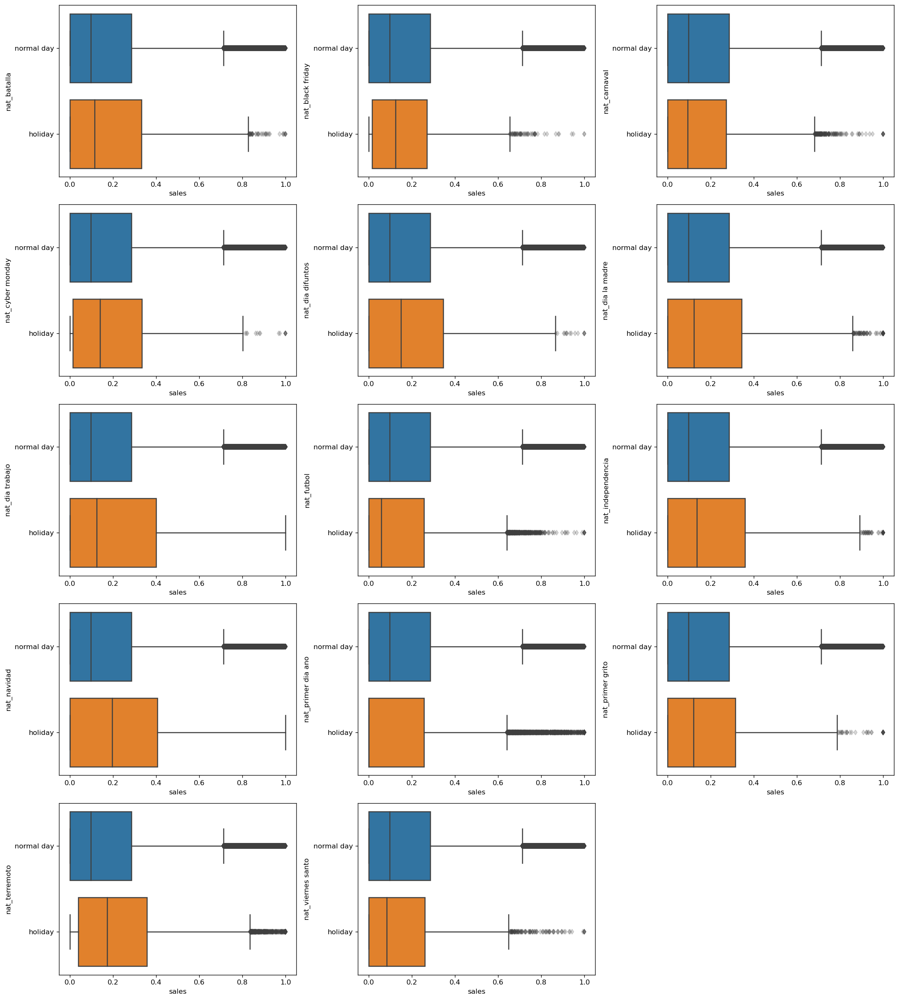

In [ ]:
def plot_national_holiday_distribution():
    df = holiday_sales_merged.copy()    
    holiday_list = national_holidays.columns[1:]  
    
    plot_kwargs = {
        "flierprops": {"alpha": 0.2},
        "orient": "h"
    }
    
    fig = plt.figure(figsize=(18, 20))
    for j, hol in enumerate(holiday_list):
        sns.boxplot(
            data=df[(df[hol].eq(1)) | (df.no_holiday.eq(1))],
            y=hol,
            x="sales",
            ax=fig.add_subplot(5, 3, j+1),
            **plot_kwargs,
        )
        plt.yticks([0, 1], ["normal day", "holiday"])   
    plt.tight_layout()
    plt.show()

plot_national_holiday_distribution()

We can observe an increase in sales with an increase in the number of products on promotions

# Analyze Outliers in the Data

{'whiskers': [<matplotlib.lines.Line2D at 0x1b1cbcd9190>,
 'caps': [<matplotlib.lines.Line2D at 0x1b1cbcd9690>,
 'boxes': [<matplotlib.lines.Line2D at 0x1b1c7d71590>],
 'medians': [<matplotlib.lines.Line2D at 0x1b1cbcdae90>],
 'fliers': [<matplotlib.lines.Line2D at 0x1b1cbcd8bd0>],
 'means': []}

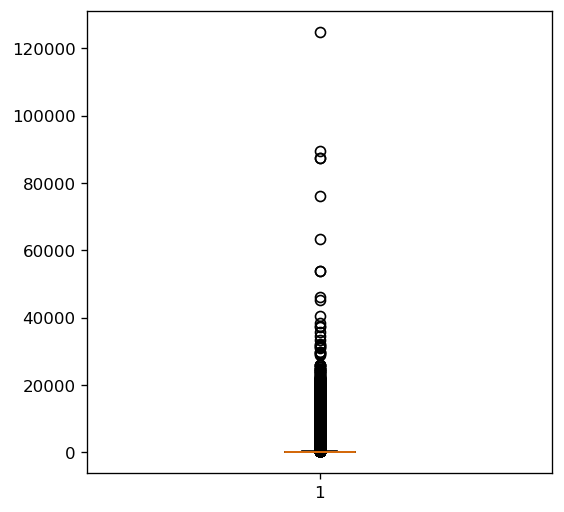

In [76]:
fig = plt.figure()
fig.set_size_inches((5,5))
plt.boxplot(train1['sales'].values)

we may notice that there are outliers in the data but we deliberately exclude them

#heatmap with correlation matrix

<Figure size 2400x1200 with 0 Axes>

<Axes: >

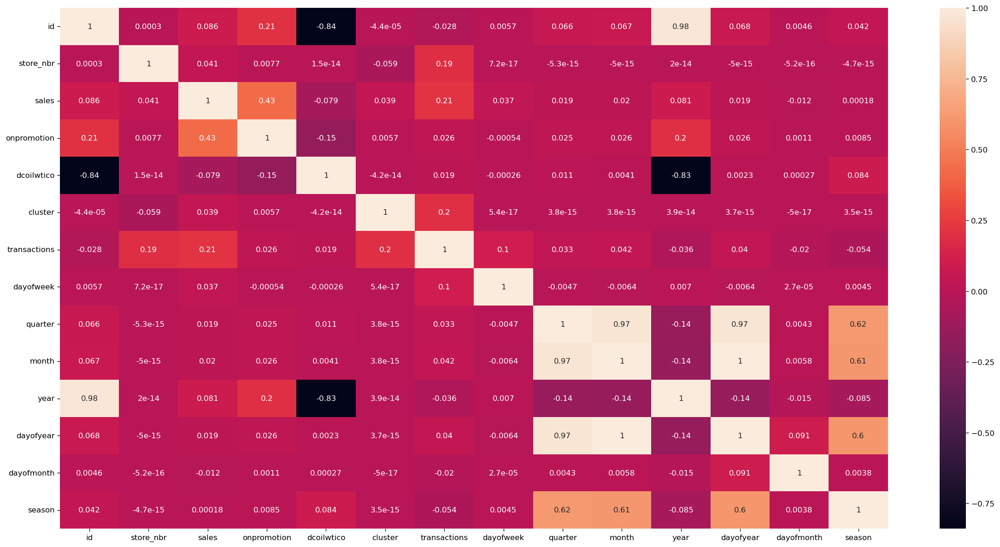

In [78]:
plt.figure(figsize=(20,10))
sns.heatmap(train1.corr(), annot=True)
plt.tight_layout()

we can notice that the signs are weakly correlated

# Hypothesis Testing

- Let's write a function that will help us undertstand whether the groups are similar to create and additional feature

T TEST
1. Normality Test: Shapiro Test
2. Homogeneity Test: Levene Test
3. Parametric or Non-Parametric T Test: T-Test, Welch Test, Mann Whitney U

In [92]:
train = open(r"C:\Users\Quynh Nhu\Downloads\train.csv\train.csv")
train = pd.read_csv(train)
train

test = open(r"C:\Users\Quynh Nhu\Downloads\test.csv")
test = pd.read_csv(test)
test

holidays['date'] = pd.to_datetime(holidays['date'], format = "%Y-%m-%d")
oil['date'] = pd.to_datetime(oil['date'], format = "%Y-%m-%d")
transactions['date'] = pd.to_datetime(transactions['date'], format = "%Y-%m-%d")
train['date'] = pd.to_datetime(train['date'], format = "%Y-%m-%d")
test['date'] = pd.to_datetime(test['date'], format = "%Y-%m-%d")
train_data_start = train.date.min().date()
train_data_end = train.date.max().date()

missing_dates = pd.date_range(train_data_start, train_data_end
                             ).difference(train.date.unique())
missing_dates = missing_dates.strftime("%Y-%m-%d").tolist()

missing_dates



,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0
1,1,2013-01-01,1,BABY CARE,0.00,0
2,2,2013-01-01,1,BEAUTY,0.00,0
3,3,2013-01-01,1,BEVERAGES,0.00,0
4,4,2013-01-01,1,BOOKS,0.00,0
...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.13,0
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.55,1
3000885,3000885,2017-08-15,9,PRODUCE,2419.73,148
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.00,8


,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0
...,...,...,...,...,...
28507,3029395,2017-08-31,9,POULTRY,1
28508,3029396,2017-08-31,9,PREPARED FOODS,0
28509,3029397,2017-08-31,9,PRODUCE,1
28510,3029398,2017-08-31,9,SCHOOL AND OFFICE SUPPLIES,9


['2013-12-25', '2014-12-25', '2015-12-25', '2016-12-25']

In [93]:
print('Holidays types:', holidays['type'].unique())
print('Holidays region types:', holidays['locale'].unique()) 
print('Holidays locale names:', holidays['locale_name'].unique())  

national_locale_name = sorted(holidays[holidays['locale']=="National"
                                           ]['locale_name'].unique().tolist())
regional_locale_name = sorted(holidays[holidays['locale']=="Regional"
                                           ]['locale_name'].unique().tolist())
local_locale_name = sorted(holidays[holidays['locale']=="Local"
                                        ]['locale_name'].unique().tolist())

print(f'Locale names for national holidays:{national_locale_name}')
print(f'Locale names for regional holidays:{regional_locale_name}')
print(f'Locale names for local holidays:{local_locale_name}')

Holidays types: ['Holiday' 'Transfer' 'Additional' 'Bridge' 'Work Day' 'Event']
Holidays region types: ['Local' 'Regional' 'National']
Holidays locale names: ['Manta' 'Cotopaxi' 'Cuenca' 'Libertad' 'Riobamba' 'Puyo' 'Guaranda'
 'Imbabura' 'Latacunga' 'Machala' 'Santo Domingo' 'El Carmen' 'Cayambe'
 'Esmeraldas' 'Ecuador' 'Ambato' 'Ibarra' 'Quevedo'
 'Santo Domingo de los Tsachilas' 'Santa Elena' 'Quito' 'Loja' 'Salinas'
 'Guayaquil']
Locale names for national holidays:['Ecuador']
Locale names for regional holidays:['Cotopaxi', 'Imbabura', 'Santa Elena', 'Santo Domingo de los Tsachilas']
Locale names for local holidays:['Ambato', 'Cayambe', 'Cuenca', 'El Carmen', 'Esmeraldas', 'Guaranda', 'Guayaquil', 'Ibarra', 'Latacunga', 'Libertad', 'Loja', 'Machala', 'Manta', 'Puyo', 'Quevedo', 'Quito', 'Riobamba', 'Salinas', 'Santo Domingo']


In [94]:
def process_holiday(s):
    if "futbol" in s:
        return "futbol"
    to_remove = list(set(stores['city'].str.lower()) | set(stores['state'].str.lower()))
    for w in to_remove:
        s = s.replace(w, "")
    return s

holidays['description'] = holidays.apply(
    lambda x: x['description'].lower().replace(x['locale_name'].lower(), ""), 
    axis=1,).apply(process_holiday).replace(
    r"[+-]\d+|\b(de|del|traslado|recupero|puente|-)\b", "", regex=True,).replace(
    r"\s+|-", " ", regex=True,).str.strip()

# remove transferred holidays
holidays = holidays[holidays['transferred'].eq(False)]

#Saturdays designated as work days 
work_days = holidays[holidays['type'].eq("Work Day")]
work_days = work_days[["date", "type"]].rename(columns={"type": "work_day"}
                                              ).reset_index(drop=True)
work_days['work_day'] = work_days['work_day'].notna().astype(int)

# remove work days after extracting above
holidays = holidays[holidays['type']!="Work Day"].reset_index(drop=True)
holidays

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,fundacion,False
1,2012-04-01,Holiday,Regional,Cotopaxi,provincializacion,False
2,2012-04-12,Holiday,Local,Cuenca,fundacion,False
3,2012-04-14,Holiday,Local,Libertad,cantonizacion,False
4,2012-04-21,Holiday,Local,Riobamba,cantonizacion,False
...,...,...,...,...,...,...
328,2017-12-22,Additional,National,Ecuador,navidad,False
329,2017-12-23,Additional,National,Ecuador,navidad,False
330,2017-12-24,Additional,National,Ecuador,navidad,False
331,2017-12-25,Holiday,National,Ecuador,navidad,False


In [96]:
#local holidays (city level) 
local_holidays = holidays[holidays['locale'].eq("Local")]
local_holidays = local_holidays[["date", "locale_name", "description"]].rename(
    columns={"locale_name": "city"}).reset_index(drop=True)

local_holidays = local_holidays[~local_holidays.duplicated()]
local_holidays = pd.get_dummies(local_holidays, columns=["description"], prefix="loc")

local_holidays.head()

,date,city,loc_cantonizacion,loc_fundacion,loc_independencia
0,2012-03-02,Manta,0,1,0
1,2012-04-12,Cuenca,0,1,0
2,2012-04-14,Libertad,1,0,0
3,2012-04-21,Riobamba,1,0,0
4,2012-05-12,Puyo,1,0,0


In [97]:
#regional holidays 
regional_holidays = holidays[holidays['locale'].eq("Regional")]
regional_holidays = regional_holidays[["date", "locale_name", "description"]].rename(
    columns={"locale_name": "state", "description": "provincializacion"}).reset_index(drop=True)
regional_holidays['provincializacion'] = regional_holidays['provincializacion'].eq(
    "provincializacion").astype(int)

regional_holidays

,date,state,provincializacion
0,2012-04-01,Cotopaxi,1
1,2012-06-25,Imbabura,1
2,2012-11-06,Santo Domingo de los Tsachilas,1
3,2012-11-07,Santa Elena,1
4,2013-04-01,Cotopaxi,1
5,2013-06-25,Imbabura,1
6,2013-11-06,Santo Domingo de los Tsachilas,1
7,2013-11-07,Santa Elena,1
8,2014-04-01,Cotopaxi,1
9,2014-06-25,Imbabura,1


In [98]:
#national holidays 
national_holidays = holidays[holidays['locale'].eq("National")]
national_holidays = national_holidays[["date", "description"]].reset_index(drop=True)
national_holidays = national_holidays[~national_holidays.duplicated()]
national_holidays = pd.get_dummies(national_holidays, columns=["description"], prefix="nat")

# different national holidays may fall on the same day
national_holidays = national_holidays.groupby("date").sum().reset_index()
# shorten name for visualization purposes later
national_holidays = national_holidays.rename(columns={
    "nat_primer grito independencia": "nat_primer grito"})

national_holidays.head()

,date,nat_batalla,nat_black friday,nat_carnaval,nat_cyber monday,nat_dia difuntos,nat_dia la madre,nat_dia trabajo,nat_futbol,nat_independencia,nat_navidad,nat_primer dia ano,nat_primer grito,nat_terremoto,nat_viernes santo
0,2012-08-10,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,2012-10-12,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2,2012-11-02,0,0,0,0,1,0,0,0,0,0,0,0,0,0
3,2012-11-03,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,2012-12-21,0,0,0,0,0,0,0,0,0,1,0,0,0,0


In [99]:
sales_ts = pd.pivot_table(train, values="sales", index="date", 
                          columns=["store_nbr", "family"])
tr_ts = pd.pivot_table(transactions, values="transactions", index="date", 
                       columns="store_nbr")
promo_ts = pd.pivot_table(train, values="onpromotion", index="date", 
                          columns=["store_nbr", "family"])

In [100]:
# scale target series
scaler = MinMaxScaler()
sales_ts_scaled = sales_ts.copy()
sales_ts_scaled[sales_ts_scaled.columns] = scaler.fit_transform(sales_ts_scaled)

# convert back to long form and add the holiday columns
holiday_sales_merged = sales_ts_scaled.melt(
    value_name="sales", ignore_index=False,).reset_index().merge(
    stores, on="store_nbr", how="left").merge(
    work_days, on="date", how="left").merge(
    local_holidays, on=["date", "city"], how="left").merge(
    regional_holidays, on=["date", "state"], how="left").merge(
    national_holidays, on="date", how="left").fillna(0)

# include dummy variable for dates without any holidays
holiday_list = [col for col in holiday_sales_merged if col.startswith((
    "loc_", "nat_", "provincializacion"))]
holiday_sales_merged["no_holiday"] = holiday_sales_merged[holiday_list].sum(
    axis=1).eq(0).astype(int)

holiday_sales_merged.head()

,date,store_nbr,family,sales,city,state,type,cluster,work_day,loc_cantonizacion,loc_fundacion,loc_independencia,provincializacion,nat_batalla,nat_black friday,nat_carnaval,nat_cyber monday,nat_dia difuntos,nat_dia la madre,nat_dia trabajo,nat_futbol,nat_independencia,nat_navidad,nat_primer dia ano,nat_primer grito,nat_terremoto,nat_viernes santo,no_holiday
0,2013-01-01,1,AUTOMOTIVE,0.00,Quito,Pichincha,D,13,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0
1,2013-01-02,1,AUTOMOTIVE,0.11,Quito,Pichincha,D,13,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1
2,2013-01-03,1,AUTOMOTIVE,0.16,Quito,Pichincha,D,13,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1
3,2013-01-04,1,AUTOMOTIVE,0.16,Quito,Pichincha,D,13,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1
4,2013-01-05,1,AUTOMOTIVE,0.26,Quito,Pichincha,D,13,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1


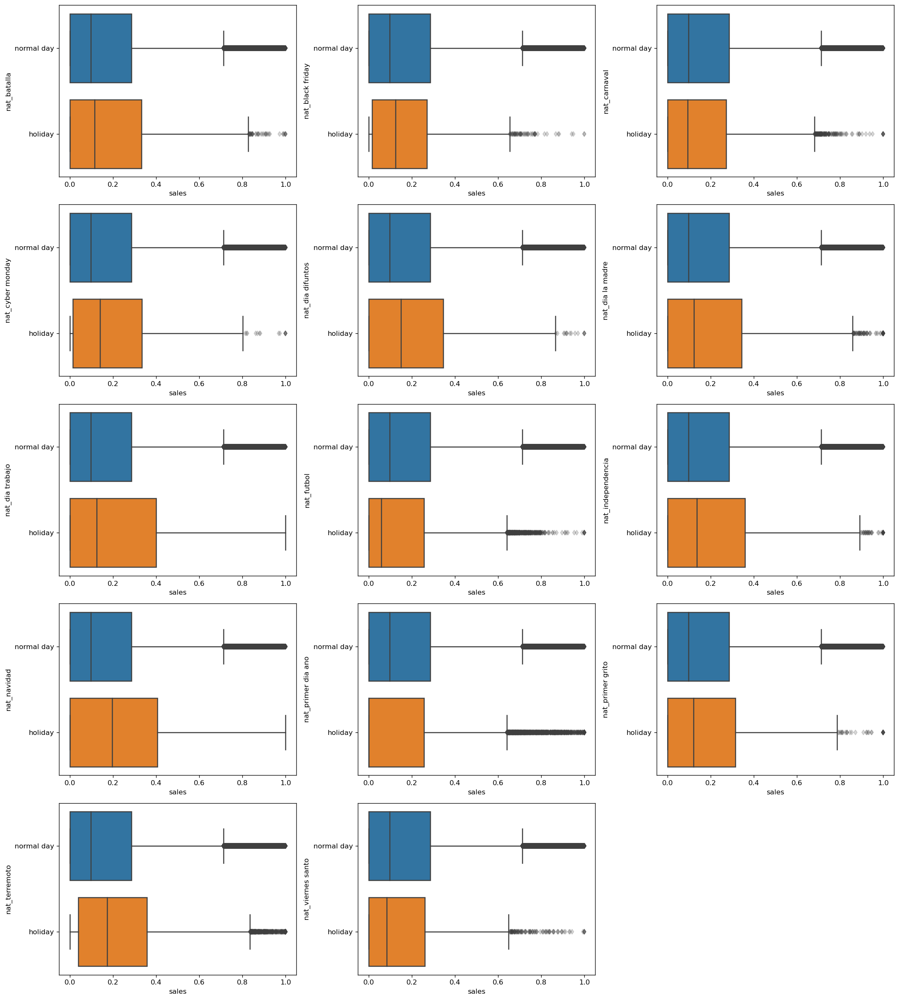

In [101]:
def plot_national_holiday_distribution():
    df = holiday_sales_merged.copy()    
    holiday_list = national_holidays.columns[1:]  
    
    plot_kwargs = {
        "flierprops": {"alpha": 0.2},
        "orient": "h"
    }
    
    fig = plt.figure(figsize=(18, 20))
    for j, hol in enumerate(holiday_list):
        sns.boxplot(
            data=df[(df[hol].eq(1)) | (df.no_holiday.eq(1))],
            y=hol,
            x="sales",
            ax=fig.add_subplot(5, 3, j+1),
            **plot_kwargs,
        )
        plt.yticks([0, 1], ["normal day", "holiday"])   
    plt.tight_layout()
    plt.show()

plot_national_holiday_distribution()

In [103]:
# keep selected national holidays with larger impacts on sales
selected_holidays = ["nat_terremoto", "nat_navidad", "nat_dia la madre", "nat_dia trabajo",
    "nat_primer dia ano", "nat_futbol", "nat_dia difuntos"]
keep_national_holidays = national_holidays[["date", *selected_holidays]]

data = pd.concat(
    [train, test], axis=0, ignore_index=True,
).merge(
    stores, on=["store_nbr"]
).merge(
    oil, on=["date"], how="left"
).merge(
    transactions, on=["date", 'store_nbr'], how="left"
).merge(
    work_days, on="date", how="left",    
).merge(
    keep_national_holidays, on=["date"],how="left").sort_values(["date", "store_nbr", "family"], ignore_index=True)

data[["work_day", *selected_holidays]] = data[["work_day", *selected_holidays]].fillna(0)

In [104]:
## Select the date, days of the week, hours, month  !not used in calculations
data['day_of_week'] = data.date.dt.dayofweek
data['day_of_year'] = data.date.dt.dayofyear
data['day_of_month'] = data.date.dt.day
data['year'] = data.date.dt.year
data['month'] = data.date.dt.month
#seasons 0-winter;1-spring;2-summer;3-fall
data["season"] = np.where(data.date.dt.month.isin([12,1,2]), 0, 1)
data["season"] = np.where(data.date.dt.month.isin([3,4,5]), 1, data["season"])
data["season"] = np.where(data.date.dt.month.isin([6,7,8]), 2, data["season"])
data["season"] = np.where(data.date.dt.month.isin([9, 10, 11]), 3, data["season"])
data.head()

,id,date,store_nbr,family,sales,onpromotion,city,state,type,cluster,dcoilwtico,transactions,work_day,nat_terremoto,nat_navidad,nat_dia la madre,nat_dia trabajo,nat_primer dia ano,nat_futbol,nat_dia difuntos,day_of_week,day_of_year,day_of_month,year,month,season
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0,Quito,Pichincha,D,13,NaN,NaN,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,1,1,1,2013,1,0
1,1,2013-01-01,1,BABY CARE,0.00,0,Quito,Pichincha,D,13,NaN,NaN,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,1,1,1,2013,1,0
2,2,2013-01-01,1,BEAUTY,0.00,0,Quito,Pichincha,D,13,NaN,NaN,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,1,1,1,2013,1,0
3,3,2013-01-01,1,BEVERAGES,0.00,0,Quito,Pichincha,D,13,NaN,NaN,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,1,1,1,2013,1,0
4,4,2013-01-01,1,BOOKS,0.00,0,Quito,Pichincha,D,13,NaN,NaN,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,1,1,1,2013,1,0


In [105]:
#Let's keep data for 1-20 stores, due to the lack of memory
data = data.loc[data['store_nbr'].isin(list(range(1, 19)))]

In [107]:
data_analyses = data.copy()

In [110]:
def CompareTwoGroups(dataframe, group, target):
    # Create Combinations
    item_comb = list(itertools.combinations(dataframe[group].unique(), 2))
    AB = pd.DataFrame()
    for i in range(0, len(item_comb)):
        # Define Groups
        groupA = dataframe[dataframe[group] == item_comb[i][0]][target]
        groupB = dataframe[dataframe[group] == item_comb[i][1]][target]
        # Assumption: Normality
        ntA = shapiro(groupA)[1] < 0.05
        ntB = shapiro(groupB)[1] < 0.05
        # H0: Distribution is Normal! - False
        # H1: Distribution is not Normal! - True
        if (ntA == False) & (ntB == False): # "H0: Normal Distribution"
            # Parametric Test
            # Assumption: Homogeneity of variances
            leveneTest = stats.levene(groupA, groupB)[1] < 0.05
            # H0: Homogeneity: False
            # H1: Heterogeneous: True
            if leveneTest == False:
                # Homogeneity
                ttest = stats.ttest_ind(groupA, groupB, equal_var=True)[1]
                # H0: M1 = M2 - False
                # H1: M1 != M2 - True
            else:
                # Heterogeneous
                ttest = stats.ttest_ind(groupA, groupB, equal_var=False)[1]
                # H0: M1 = M2 - False
                # H1: M1 != M2 - True
        else:
            # Non-Parametric Test
            ttest = stats.mannwhitneyu(groupA, groupB)[1] 
            # H0: M1 = M2 - False
            # H1: M1 != M2 - True
            
        temp = pd.DataFrame({"Compare Two Groups":[ttest < 0.05], 
                             "p-value":[ttest],
                             "GroupA_Mean":[groupA.mean()], 
                             "GroupB_Mean":[groupB.mean()],
                             "GroupA_Median":[groupA.median()], 
                             "GroupB_Median":[groupB.median()],
                             "GroupA_Count":[groupA.count()], 
                             "GroupB_Count":[groupB.count()]}, index = [item_comb[i]])
        temp["Compare Two Groups"] = np.where(temp["Compare Two Groups"] == True, 
                                              "Different Groups", "Similar Groups")
        temp["TestType"] = np.where((ntA == False) & (ntB == False), "Parametric", "Non-Parametric")
        
        AB = pd.concat([AB, temp[["TestType", "Compare Two Groups", 
                                  "p-value","GroupA_Median", "GroupB_Median",
                                  "GroupA_Mean", "GroupB_Mean",
                                  "GroupA_Count", "GroupB_Count"]]])   
    return AB

CompareTwoGroups(train, group = "store_nbr", target = "sales")

,TestType,Compare Two Groups,p-value,GroupA_Median,GroupB_Median,GroupA_Mean,GroupB_Mean,GroupA_Count,GroupB_Count
"(1, 10)",Non-Parametric,Different Groups,0.00,19.00,5.00,254.53,173.00,55572,55572
"(1, 11)",Non-Parametric,Different Groups,0.00,19.00,15.00,254.53,509.71,55572,55572
"(1, 12)",Non-Parametric,Different Groups,0.00,19.00,6.00,254.53,191.81,55572,55572
"(1, 13)",Non-Parametric,Different Groups,0.00,19.00,6.00,254.53,189.36,55572,55572
"(1, 14)",Non-Parametric,Different Groups,0.00,19.00,6.00,254.53,204.92,55572,55572
...,...,...,...,...,...,...,...,...,...
"(6, 8)",Non-Parametric,Different Groups,0.00,29.00,39.00,453.17,548.73,55572,55572
"(6, 9)",Non-Parametric,Different Groups,0.00,29.00,18.00,453.17,475.23,55572,55572
"(7, 8)",Non-Parametric,Different Groups,0.00,27.24,39.00,484.99,548.73,55572,55572
"(7, 9)",Non-Parametric,Different Groups,0.00,27.24,18.00,484.99,475.23,55572,55572


In [111]:
# Rolling Summary Stats Features
#A rolling mean is simply the mean of a certain number of previous periods in a time series.
for i in [16,17,18,19,20,21,22,46,76,106,365, 730]:
    data_analyses["sales_roll_mean_"+str(i)]=data_analyses.groupby(
        ["store_nbr", "family"])['sales'].rolling(i).mean().shift(1).values
    
# 2. Hypothesis Testing: Similarity
# Store Based
storesales = train.groupby(["date", "store_nbr"])['sales'].sum().reset_index()
ctg_ss = CompareTwoGroups(storesales, group="store_nbr", target="sales")
del storesales
#Let's find similar groups
ctg_ss[ctg_ss["Compare Two Groups"] == "Similar Groups"]

,TestType,Compare Two Groups,p-value,GroupA_Median,GroupB_Median,GroupA_Mean,GroupB_Mean,GroupA_Count,GroupB_Count
"(1, 33)",Non-Parametric,Similar Groups,0.87,8455.42,8037.70,8399.65,8419.54,1684,1684
"(1, 41)",Non-Parametric,Similar Groups,0.05,8455.42,8520.27,8399.65,8902.04,1684,1684
"(3, 47)",Non-Parametric,Similar Groups,0.54,29515.49,28914.91,29977.38,30254.34,1684,1684
"(4, 27)",Non-Parametric,Similar Groups,0.52,10947.12,11141.27,11229.04,11394.31,1684,1684
"(4, 38)",Non-Parametric,Similar Groups,0.74,10947.12,10576.70,11229.04,11199.52,1684,1684
"(4, 40)",Non-Parametric,Similar Groups,0.31,10947.12,11088.88,11229.04,10923.85,1684,1684
"(5, 36)",Non-Parametric,Similar Groups,0.58,9139.31,9287.31,9259.15,9098.83,1684,1684
"(6, 24)",Non-Parametric,Similar Groups,0.49,14510.74,14648.96,14954.68,14113.86,1684,1684
"(10, 29)",Non-Parametric,Similar Groups,0.44,5486.06,6320.88,5708.97,5775.03,1684,1684
"(11, 50)",Non-Parametric,Similar Groups,0.25,16191.82,16010.62,16820.40,17014.86,1684,1684


In [112]:
data_analyses["StoreSalesSimilarity"] = np.where(data_analyses["store_nbr"].isin([12,16]), 1, 0)
data_analyses["StoreSalesSimilarity"] = np.where(data_analyses["store_nbr"].isin([14,15]), 2, data_analyses["StoreSalesSimilarity"])

#Now let's filter the results by similarity of groups when grouped by "family"
# Item Based
itemsales = train.groupby(["date", "family"])['sales'].sum().reset_index()
ctg_is = CompareTwoGroups(itemsales, group = "family", target = "sales")
del itemsales
ctg_is[ctg_is["Compare Two Groups"] == "Similar Groups"]

,TestType,Compare Two Groups,p-value,GroupA_Median,GroupB_Median,GroupA_Mean,GroupB_Mean,GroupA_Count,GroupB_Count
"(BEAUTY, PET SUPPLIES)",Non-Parametric,Similar Groups,0.23,183.00,235.00,200.65,211.75,1684,1684
"(DELI, PERSONAL CARE)",Non-Parametric,Similar Groups,0.47,13875.06,13518.00,14317.29,14603.36,1684,1684
"(HOME AND KITCHEN I, SEAFOOD)",Non-Parametric,Similar Groups,0.15,1258.00,1152.09,1105.40,1196.81,1684,1684
"(LADIESWEAR, LINGERIE)",Non-Parametric,Similar Groups,0.41,428.00,370.00,386.67,387.83,1684,1684
"(LAWN AND GARDEN, PLAYERS AND ELECTRONICS)",Non-Parametric,Similar Groups,0.20,235.00,391.00,325.92,334.09,1684,1684


As we can see, there were two pairs of similar family (CELEBRATION, LINGERIE),(GROCERY II, HOME AND KITCHEN I), (HOME APPLIANCES, SCHOOL AND OFFICE SUPPLIES), (LAWN AND GARDEN, PLAYERS AND ELECTRONICS), (MAGAZINES, PET SUPPLIES) and we can create a special feature reflecting the similarity of the family

In [113]:
data_analyses["ItemSalesSimilarity"] = np.where(data_analyses['family'].isin(['CELEBRATION', 'LINGERIE']), 1, 0)
data_analyses["ItemSalesSimilarity"] = np.where(data_analyses['family'].isin(['GROCERY II', 'HOME AND KITCHEN I']), 2, data_analyses["ItemSalesSimilarity"])
data_analyses["ItemSalesSimilarity"] = np.where(data_analyses['family'].isin(['HOME APPLIANCES', 'SCHOOL AND OFFICE SUPPLIES']), 3, data_analyses["ItemSalesSimilarity"])
data_analyses["ItemSalesSimilarity"] = np.where(data_analyses['family'].isin(['LAWN AND GARDEN', 'PLAYERS AND ELECTRONICS']), 4, data_analyses["ItemSalesSimilarity"])
data_analyses["ItemSalesSimilarity"] = np.where(data_analyses['family'].isin(['MAGAZINES', 'PET SUPPLIES']), 5, data_analyses["ItemSalesSimilarity"])

In [114]:
data_analyses.sort_values(by=['store_nbr', 'family', 'date'], axis=0, inplace=True)

In [115]:
def lag_features(dataframe, lags, groups = ["store_nbr", "family"], target = "sales", prefix = ''):
    dataframe = dataframe.copy()
    for lag in lags:
        dataframe[prefix + str(lag)] = dataframe.groupby(groups)[target].transform(
            lambda x: x.shift(lag))
    return dataframe

#Let's create lags
data_analyses = lag_features(data_analyses, 
                             lags = [16,17,18,19,20,21,22,46,76,106,365, 730],
                             groups = ["store_nbr", "family"], target = 'sales', 
                             prefix = 'sales_lag_')
data_analyses

,id,date,store_nbr,family,sales,onpromotion,city,state,type,cluster,dcoilwtico,transactions,work_day,nat_terremoto,nat_navidad,nat_dia la madre,nat_dia trabajo,nat_primer dia ano,nat_futbol,nat_dia difuntos,day_of_week,day_of_year,day_of_month,year,month,season,sales_roll_mean_16,sales_roll_mean_17,sales_roll_mean_18,sales_roll_mean_19,sales_roll_mean_20,sales_roll_mean_21,sales_roll_mean_22,sales_roll_mean_46,sales_roll_mean_76,sales_roll_mean_106,sales_roll_mean_365,sales_roll_mean_730,StoreSalesSimilarity,ItemSalesSimilarity,sales_lag_16,sales_lag_17,sales_lag_18,sales_lag_19,sales_lag_20,sales_lag_21,sales_lag_22,sales_lag_46,sales_lag_76,sales_lag_106,sales_lag_365,sales_lag_730
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0,Quito,Pichincha,D,13,NaN,NaN,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,1,1,1,2013,1,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1782,1782,2013-01-02,1,AUTOMOTIVE,2.00,0,Quito,Pichincha,D,13,93.14,2111.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2,2,2,2013,1,0,1.88,2.00,2.06,2.32,2.25,2.38,2.36,3.00,2.71,2.53,2.40,NaN,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3564,3564,2013-01-03,1,AUTOMOTIVE,3.00,0,Quito,Pichincha,D,13,92.97,1833.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3,3,3,2013,1,0,4.75,4.59,4.72,4.79,4.70,4.67,4.86,5.28,4.79,4.91,3.71,3.23,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5346,5346,2013-01-04,1,AUTOMOTIVE,3.00,0,Quito,Pichincha,D,13,93.12,1863.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4,4,4,2013,1,0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,NaN,NaN,NaN,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7128,7128,2013-01-05,1,AUTOMOTIVE,5.00,0,Quito,Pichincha,D,13,NaN,1509.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5,5,5,2013,1,0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,NaN,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3021083,3020819,2017-08-27,18,SEAFOOD,NaN,0,Quito,Pichincha,B,16,NaN,NaN,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,6,239,27,2017,8,2,1.38,1.41,1.44,1.53,1.45,1.48,1.41,3.80,3.79,2.80,0.92,1.72,0,0,8.00,11.00,9.89,19.12,12.24,19.98,22.00,6.51,11.33,20.41,0.00,4.71
3022865,3022601,2017-08-28,18,SEAFOOD,NaN,0,Quito,Pichincha,B,16,46.40,NaN,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,240,28,2017,8,2,2.69,2.65,2.67,2.74,2.80,2.76,2.64,2.91,4.11,4.50,2.15,1.83,0,0,13.32,8.00,11.00,9.89,19.12,12.24,19.98,10.09,11.63,18.53,0.00,4.33
3024647,3024383,2017-08-29,18,SEAFOOD,NaN,0,Quito,Pichincha,B,16,46.46,NaN,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1,241,29,2017,8,2,5.22,5.97,6.10,6.00,5.85,5.81,6.05,6.75,7.58,9.65,9.97,NaN,0,0,15.93,13.32,8.00,11.00,9.89,19.12,12.24,8.72,5.00,12.32,0.00,7.22
3026429,3026165,2017-08-30,18,SEAFOOD,NaN,0,Quito,Pichincha,B,16,45.96,NaN,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2,242,30,2017,8,2,6.07,6.05,6.07,5.93,5.79,5.57,5.50,6.56,6.60,7.26,7.00,8.48,0,0,8.99,15.93,13.32,8.00,11.00,9.89,19.12,25.73,5.00,7.62,0.00,14.92


In [116]:
#remove the most correlated features
def drop_cor(dataframe, name, index):
    ind = dataframe[dataframe.columns[dataframe.columns.str.contains(name)].tolist()+[
        "sales"]].corr().sales.sort_values(ascending = False).index[1:index]
    ind = dataframe.drop(ind, axis = 1).columns[dataframe.drop(ind, axis = 1).columns.str.contains(name)]
    dataframe.drop(ind, axis = 1, inplace = True)

drop_cor(data_analyses, "sales_lag", 6)

In [117]:
# 4. New Features -->Last i. Months 
data_analyses["monthyear"] = data_analyses.date.dt.to_period('M')

# Store-Item Based
for i in [3, 6, 9, 12, 15, 18, 21, 24]:
    last_months = data_analyses.groupby(["store_nbr", "family", "monthyear"
                                        ]).sales.agg(["sum","mean","std","min","max"]).shift(i).reset_index()
    last_months.columns = ['store_nbr', 'family', 'monthyear', 'last_'+str(i)+'months_sales_sum',
                           'last_'+str(i)+'months_sales_mean', 'last_'+str(i)+'months_sales_std',
                           'last_'+str(i)+'months_sales_min', 'last_'+str(i)+'months_sales_max']
    data_analyses = pd.merge(data_analyses, last_months, how   = "left", on = ["store_nbr", "family", "monthyear"])
del last_months, i

drop_cor(data_analyses, "last_", 6)

# Store Based
for i in [3, 6, 9, 12]:
    last_months = data_analyses.groupby(["store_nbr", "monthyear"
                                        ]).sales.agg(["sum", "mean", "std", "min", "max"]).shift(i).reset_index()
    last_months.columns = ['store_nbr', 'monthyear', 'store_last_'+str(i)+'months_sales_sum',
                           'store_last_'+str(i)+'months_sales_mean', 'store_last_'+str(i)+'months_sales_std',
                           'store_last_'+str(i)+'months_sales_min', 'store_last_'+str(i)+'months_sales_max']
    data_analyses = pd.merge(data_analyses, last_months, how = "left", on = ["store_nbr", "monthyear"])
del last_months, i

# Item Based
for i in [3, 6, 9, 12]:
    last_months = data_analyses.groupby(["family", "monthyear"
                                        ]).sales.agg(["sum", "mean", "std", "min", "max"]).shift(i).reset_index()
    last_months.columns = ['family', 'monthyear', 'item_last_'+str(i)+'months_sales_sum',
                           'item_last_'+str(i)+'months_sales_mean', 'item_last_'+str(i)+'months_sales_std',
                           'item_last_'+str(i)+'months_sales_min', 'item_last_'+str(i)+'months_sales_max']
    data_analyses = pd.merge(data_analyses, last_months, how = "left", on = ["family", "monthyear"])
del last_months, i

# Similarity Based
for i in [3, 6, 9, 12]:
    last_months = data_analyses.groupby(["StoreSalesSimilarity", "monthyear"
                                        ]).sales.agg(["sum", "mean", "std", "min", "max"]).shift(i).reset_index()
    last_months.columns = ['StoreSalesSimilarity', 'monthyear', 'storesim_last_'+str(i)+'months_sales_sum',
                           'storesim_last_'+str(i)+'months_sales_mean', 'storesim_last_'+str(i)+'months_sales_std',
                           'storesim_last_'+str(i)+'months_sales_min', 'storesim_last_'+str(i)+'months_sales_max']
    data_analyses = pd.merge(data_analyses, last_months, how = "left", on = ["StoreSalesSimilarity", "monthyear"])
del last_months, i


for i in [3, 6, 9, 12]:
    last_months = data_analyses.groupby(["ItemSalesSimilarity", "monthyear"
                                        ]).sales.agg(["sum", "mean", "std", "min", "max"]).shift(i).reset_index()
    last_months.columns = ['ItemSalesSimilarity', 'monthyear', 'itemsim_last_'+str(i)+'months_sales_sum',
                           'itemsim_last_'+str(i)+'months_sales_mean', 'itemsim_last_'+str(i)+'months_sales_std',
                           'itemsim_last_'+str(i)+'months_sales_min', 'itemsim_last_'+str(i)+'months_sales_max']
    data_analyses = pd.merge(data_analyses, last_months, how = "left", on = ["ItemSalesSimilarity", "monthyear"])
del last_months, i

data_analyses.drop("monthyear", axis = 1, inplace = True)

In [118]:
# 5. New Features -->Last i. day of week
data_analyses.sort_values(["store_nbr", "family", "day_of_week", "date"], inplace = True)

data_analyses = lag_features(data_analyses, 
                             lags = np.arange(12,41, 1).tolist()+[16,46,76,106],
                             groups = ["store_nbr", "family", "day_of_week"], 
                             target = 'sales', 
                             prefix = 'dayofweek_sales_lag_')

data_analyses[data_analyses.columns[data_analyses.columns.str.contains("dayofweek_sales_lag_")].tolist()+["sales"]].corr().sales.sort_values(ascending = False)

drop_cor(data_analyses, "dayofweek_sales_lag_", 6)

sales                     1.00
dayofweek_sales_lag_13    0.90
dayofweek_sales_lag_39    0.89
dayofweek_sales_lag_12    0.89
dayofweek_sales_lag_35    0.89
dayofweek_sales_lag_17    0.89
dayofweek_sales_lag_37    0.89
dayofweek_sales_lag_15    0.89
dayofweek_sales_lag_14    0.89
dayofweek_sales_lag_26    0.89
dayofweek_sales_lag_38    0.88
dayofweek_sales_lag_40    0.88
dayofweek_sales_lag_34    0.88
dayofweek_sales_lag_36    0.88
dayofweek_sales_lag_16    0.88
dayofweek_sales_lag_18    0.88
dayofweek_sales_lag_33    0.88
dayofweek_sales_lag_27    0.88
dayofweek_sales_lag_28    0.88
dayofweek_sales_lag_25    0.88
dayofweek_sales_lag_24    0.88
dayofweek_sales_lag_30    0.88
dayofweek_sales_lag_19    0.88
dayofweek_sales_lag_46    0.88
dayofweek_sales_lag_32    0.88
dayofweek_sales_lag_22    0.88
dayofweek_sales_lag_31    0.88
dayofweek_sales_lag_76    0.87
dayofweek_sales_lag_29    0.87
dayofweek_sales_lag_20    0.87
dayofweek_sales_lag_23    0.87
dayofweek_sales_lag_21    0.87
dayofwee

In [119]:
data_analyses.sort_values(["store_nbr", "family", "date"], inplace = True)

In [120]:
# Exponentially Weighted Mean Features
def ewm_features(dataframe, alphas, lags):
    dataframe = dataframe.copy()
    for alpha in alphas:
        for lag in lags:
            dataframe['sales_ewm_alpha_' + str(alpha).replace(".", "") + "_lag_" + str(lag)
                     ] = dataframe.groupby(["store_nbr", "family"]
                                          )['sales'].transform(lambda x: x.shift(lag).ewm(alpha=alpha).mean())
    return dataframe

alphas = [0.95, 0.9, 0.8, 0.7, 0.5]
lags = [16,17,18,19,20,21,22,46,76,106,365, 730]

data_analyses = ewm_features(data_analyses, alphas, lags)

In [121]:
# Day of year
data_analyses.sort_values(["day_of_year", "store_nbr", "family"], inplace = True)
data_analyses = lag_features(data_analyses, 
                             lags = [1,2,3,4],
                             groups = ["day_of_year", "store_nbr", "family"], 
                             target = 'sales', 
                             prefix = 'dayofyear_sales_lag_')

# pd.cut
clus = data_analyses.groupby(["store_nbr"])['sales'].mean().reset_index()
clus["store_cluster"] =  pd.cut(clus['sales'], bins = 4, labels = range(1,5))
clus.drop("sales", axis = 1, inplace = True)
data_analyses = pd.merge(data_analyses, clus, how = "left")
clus = data_analyses.groupby(["family"])['sales'].mean().reset_index()
clus["family_cluster"] =  pd.cut(clus['sales'], bins = 5, labels = range(1,6))
clus.drop("sales", axis = 1, inplace = True)
data_analyses = pd.merge(data_analyses, clus, how = "left")
del clus

data_analyses.shape

(1009800, 201)

# Train-Validation Split

In [122]:
# Dataframe must be sorted by date because of Time Series Split 
data_analyses = data_analyses.sort_values("date").reset_index(drop = True)

#Let's bring all the columns into a single form to avoid further errors
columns_old = data_analyses.columns
columns_new = [column.replace(" ", "_") for column in columns_old]
data_analyses.columns = columns_new
del columns_old, columns_new 

#Let's define the columns that will be further used in the analysis
features = [col for col in data_analyses.columns if col not in ['date', 'id', "sales", 'transactions',
                                                                'day_of_week','day_of_year','day_of_month',
                                                                'year', 'month', 'season','test']]
#Let's fill NA
data_analyses = data_analyses.fillna(0)

#Let's make the data readable
data_analyses['store_nbr']=data_analyses['store_nbr'].apply(lambda x: (f"store_nbr_{x}"))
data_analyses['cluster']=data_analyses['cluster'].apply(lambda x: (f"cluster_{x}"))
data_analyses['type'] = data_analyses['type'].apply(lambda x: (f"type_{x}"))
data_analyses['city'] = data_analyses['city'].apply(lambda x: (f"city_{x.lower()}"))
data_analyses['state'] = data_analyses['state'].apply(lambda x: (f"state_{x.lower()}"))
data_analyses.head()

,id,date,store_nbr,family,sales,onpromotion,city,state,type,cluster,dcoilwtico,transactions,work_day,nat_terremoto,nat_navidad,nat_dia_la_madre,nat_dia_trabajo,nat_primer_dia_ano,nat_futbol,nat_dia_difuntos,day_of_week,day_of_year,day_of_month,year,month,season,sales_roll_mean_16,sales_roll_mean_17,sales_roll_mean_18,sales_roll_mean_19,sales_roll_mean_20,sales_roll_mean_21,sales_roll_mean_22,sales_roll_mean_46,sales_roll_mean_76,sales_roll_mean_106,sales_roll_mean_365,sales_roll_mean_730,StoreSalesSimilarity,ItemSalesSimilarity,sales_lag_16,sales_lag_20,sales_lag_21,sales_lag_22,sales_lag_76,last_3months_sales_sum,last_3months_sales_mean,last_3months_sales_min,last_6months_sales_sum,last_6months_sales_mean,store_last_3months_sales_sum,store_last_3months_sales_mean,store_last_3months_sales_std,store_last_3months_sales_min,store_last_3months_sales_max,store_last_6months_sales_sum,store_last_6months_sales_mean,store_last_6months_sales_std,store_last_6months_sales_min,store_last_6months_sales_max,store_last_9months_sales_sum,store_last_9months_sales_mean,store_last_9months_sales_std,store_last_9months_sales_min,store_last_9months_sales_max,store_last_12months_sales_sum,store_last_12months_sales_mean,store_last_12months_sales_std,store_last_12months_sales_min,store_last_12months_sales_max,item_last_3months_sales_sum,item_last_3months_sales_mean,item_last_3months_sales_std,item_last_3months_sales_min,item_last_3months_sales_max,item_last_6months_sales_sum,item_last_6months_sales_mean,item_last_6months_sales_std,item_last_6months_sales_min,item_last_6months_sales_max,item_last_9months_sales_sum,item_last_9months_sales_mean,item_last_9months_sales_std,item_last_9months_sales_min,item_last_9months_sales_max,item_last_12months_sales_sum,item_last_12months_sales_mean,item_last_12months_sales_std,item_last_12months_sales_min,item_last_12months_sales_max,storesim_last_3months_sales_sum,storesim_last_3months_sales_mean,storesim_last_3months_sales_std,storesim_last_3months_sales_min,storesim_last_3months_sales_max,storesim_last_6months_sales_sum,storesim_last_6months_sales_mean,storesim_last_6months_sales_std,storesim_last_6months_sales_min,storesim_last_6months_sales_max,storesim_last_9months_sales_sum,storesim_last_9months_sales_mean,storesim_last_9months_sales_std,storesim_last_9months_sales_min,storesim_last_9months_sales_max,storesim_last_12months_sales_sum,storesim_last_12months_sales_mean,storesim_last_12months_sales_std,storesim_last_12months_sales_min,storesim_last_12months_sales_max,itemsim_last_3months_sales_sum,itemsim_last_3months_sales_mean,itemsim_last_3months_sales_std,itemsim_last_3months_sales_min,itemsim_last_3months_sales_max,itemsim_last_6months_sales_sum,itemsim_last_6months_sales_mean,itemsim_last_6months_sales_std,itemsim_last_6months_sales_min,itemsim_last_6months_sales_max,itemsim_last_9months_sales_sum,itemsim_last_9months_sales_mean,itemsim_last_9months_sales_std,itemsim_last_9months_sales_min,itemsim_last_9months_sales_max,itemsim_last_12months_sales_sum,itemsim_last_12months_sales_mean,itemsim_last_12months_sales_std,itemsim_last_12months_sales_min,itemsim_last_12months_sales_max,dayofweek_sales_lag_12,dayofweek_sales_lag_13,dayofweek_sales_lag_17,dayofweek_sales_lag_35,dayofweek_sales_lag_39,sales_ewm_alpha_095_lag_16,sales_ewm_alpha_095_lag_17,sales_ewm_alpha_095_lag_18,sales_ewm_alpha_095_lag_19,sales_ewm_alpha_095_lag_20,sales_ewm_alpha_095_lag_21,sales_ewm_alpha_095_lag_22,sales_ewm_alpha_095_lag_46,sales_ewm_alpha_095_lag_76,sales_ewm_alpha_095_lag_106,sales_ewm_alpha_095_lag_365,sales_ewm_alpha_095_lag_730,sales_ewm_alpha_09_lag_16,sales_ewm_alpha_09_lag_17,sales_ewm_alpha_09_lag_18,sales_ewm_alpha_09_lag_19,sales_ewm_alpha_09_lag_20,sales_ewm_alpha_09_lag_21,sales_ewm_alpha_09_lag_22,sales_ewm_alpha_09_lag_46,sales_ewm_alpha_09_lag_76,sales_ewm_alpha_09_lag_106,sales_ewm_alpha_09_lag_365,sales_ewm_alpha_09_lag_730,sales_ewm_alpha_08_lag_16,sales_ewm_alpha_08_lag_17,sales_ewm_alpha_08_lag_18,sales_ewm_alp

In [ ]:
#let's divide the data into training and validation and use them at the stage of identifying important features
train_f = data_analyses.copy()
val_f = data_analyses.copy()
train_f = train_f.loc[(train_f["date"] < "2017-01-01"), :]
val_f = val_f.loc[(val_f["date"] >= "2017-01-01") & (val_f["date"] < "2017-08-16"), :]
Y_train = train_f['sales']
X_train = train_f[features]
Y_val = val_f['sales']
X_val = val_f[features]

#let's define object columns
object_cols = X_train.loc[:,X_train.dtypes==np.object].columns
object_cols = list(object_cols)
cols_for_le = object_cols 
cols_for_le = [list(X_train.columns).index(col) for col in cols_for_le]

#let's transform categorical features 
t = [('MeanTargetEncoder', TargetEncoder(), cols_for_le)]
col_transform = ColumnTransformer(transformers=t)
col_transform.set_output(transform="pandas")
X_trans_tr =col_transform.fit_transform(X_train,Y_train)
X_val_tr =col_transform.fit_transform(X_val,Y_val)

Y_train.shape, X_trans_tr.shape, Y_val.shape, X_val_tr.shape